# Sommaire :

### <a href="#C1"> **Partie 1 : Contexte et Objectifs**</a>

   - Contexte
   - Objectifs

<b><hr></b>

### <a href="#C2"> **Partie 2 : Mise en place de l'espace de travail**</a>
- <a href="#C21"> 2.1 Import des packages</a>
- <a href="#C22"> 2.2 Repertoire de travail</a>
- <a href="#C23"> 2.3 Import des datas frames</a>

<b><hr></b>

### <a href="#C3"> **Partie 3 : Analyse exploratoire et etude des jeux de données EDA**</a>
- <a href="#C31"> 3.1 Display </a>
- <a href="#C32"> 3.2 Structure du dataframes </a>
- <a href="#C33"> 3.3 Les valeurs manquantes et les doublons du dataframes </a>
- <a href="#C34"> 3.4 Data inspections </a>
- <a href="#C35"> 3.5 Data Visualisation Multivariée </a>
- <a href="#C36"> 3.6 Normalité </a>
- <a href="#C37"> 3.7 Multi Colinéarité </a>
    
<b><hr></b>
 
### <a href="#C4"> **Partie 4 : Cleaning**</a>
- <a href="#C41"> 4.1 Imputer missing Values</a>
- <a href="#C42"> 4.2 Encoding object colonnes (LabelEncoding/OrdinalEncoder/OneHotEncoding) </a>
- <a href="#C43"> 4.3 Export csv</a>
 
<b><hr></b>

### <a href="#C5"> **Partie 5 : Conclusion**</a>


# <a name="C1">**Partie 1 : Contexte et Objectifs**</a> 

Contexte

Vous travaillez pour la ville de Seattle. 
Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, 
votre équipe s’intéresse de près à la consommation et aux émissions des bâtiments non destinés à l’habitation.

Des relevés minutieux ont été effectués par les agents de la ville en 2016. <br>
Voici la <a href = "https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy">source des données</a>. 

Objectifs

# <a name="C2"><font color='blue'>**Partie 2 : Mise en place de l'espace de travail**</font></a> 

### <a name="C21"><font color='blue'>2.1 Imports packages</font></a> 

###### <b><font color='blue'>2.1.0 Requirements</font></b>
- <b>Built-in</b>       : os, warnings
- <b>Data</b>           : pandas, numpy
- <b>Visualisations</b> : matplotlib, seaborn
- <b>Preprocessing</b>  : sklearn, scipy

###### <b><font color='blue'>2.1.1 Imports</font></b>

In [1]:
# Built-in
import os, warnings 

# Data
import numpy as np
import pandas as pd

#Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
#%matplotlib inline

# Imputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer,KNNImputer,IterativeImputer

#Preprocessing
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder,StandardScaler,MinMaxScaler

#metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error,accuracy_score

# feature selection
from sklearn.feature_selection import VarianceThreshold   
from scipy.stats import entropy  

### <a name="C22"><font color='blue'>2.2 Working directory</font></a> 

In [2]:
os.listdir()

['.git',
 '.gitignore',
 '.ipynb_checkpoints',
 '00_EDA P4.ipynb',
 '02_modelisation_consommation totale d’énergie.ipynb',
 '02_modelisation_emission de CO2.ipynb',
 '2016_Building_Energy_Benchmarking.csv',
 'Brouillon.ipynb',
 'Bullitt Center.png',
 'data',
 'ModeleCO2.ipynb',
 'rapport.html',
 'README.md']

In [3]:
os.listdir('data/source')

['2016_Building_Energy_Benchmarking.csv']

In [4]:
path = 'data/source/'
# A completer
filename = '2016_Building_Energy_Benchmarking.csv'

### <a name="C23"><font color='blue'>2.3 Import DataFrames</font></a> 

In [5]:
df = pd.read_csv(path+filename)

# <a name="C3"><font color='teal'>**Partie 3 : Analyse exploratoire et etude des jeux de données EDA**</font></a> 

### <a name="C31"><font color='teal'>3.1 Display</font></a>

In [6]:
df.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [7]:
df.sample(5)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1996,24099,2016,NonResidential,Other,Thermal Supply,717 S Lander,Seattle,WA,98134.0,7666203655,...,187982.90630,641398.0,115.939987,11594.0,False,NaN,Compliant,NaN,5.09,0.16
176,283,2016,NonResidential,Small- and Mid-Sized Office,Lake City Center,12360 Lake City Way NE,Seattle,WA,98125.0,8822900465,...,749863.12500,2558533.0,5885.089844,588509.0,False,NaN,Compliant,NaN,49.09,0.97
835,19936,2016,Multifamily LR (1-4),Low-Rise Multifamily,Belmont Place,710 Belmont PL E,Seattle,WA,98102.0,0705500000,...,81661.60156,278629.0,10297.190430,1029719.0,False,NaN,Compliant,NaN,56.63,1.90
2108,24492,2016,Multifamily LR (1-4),Low-Rise Multifamily,House A,5130 40th AVE NE,Seattle,WA,98105.0,7974700259,...,730230.18750,2491545.0,10874.629880,1087463.0,False,NaN,Compliant,NaN,75.12,1.02
1904,23758,2016,Multifamily MR (5-9),Mid-Rise Multifamily,615 E Pike Street Condominium,615 E Pike Street,Seattle,WA,98122.0,7804330000,...,129027.79690,440243.0,0.000000,0.0,False,NaN,Compliant,NaN,3.07,0.10


### <a name="C32"><font color='teal'>3.2 Structure du dataframe</font></a> 

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

##### Filtrage des colonnes selon la consigne

<AxesSubplot:xlabel='SiteEnergyUse(kBtu)', ylabel='SiteEnergyUseWN(kBtu)'>

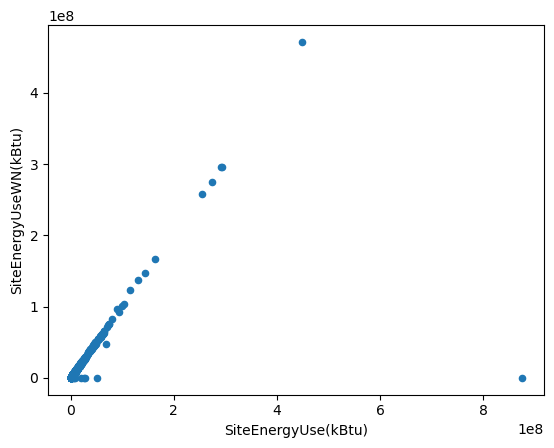

In [9]:
df[[ 'SiteEnergyUse(kBtu)','SiteEnergyUseWN(kBtu)']].plot(x='SiteEnergyUse(kBtu)',y='SiteEnergyUseWN(kBtu)',kind='scatter')

Les valeurs 0 pour SiteEnergyUseWN(kBtu) correspondent à une imputation liée à une anomalie.
Donc lorsque celle ci sera égale à 0 la ligne sera supprimé

In [10]:
df.drop(columns=['SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SteamUse(kBtu)', 'Electricity(kWh)', 'Electricity(kBtu)', 
       'NaturalGas(therms)', 'NaturalGas(kBtu)', 'GHGEmissionsIntensity',
       'SiteEnergyUse(kBtu)',
       #'SiteEnergyUseWN(kBtu)'
                ],
       inplace=True)

In [11]:
df.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEnergyUseWN(kBtu)',
       'DefaultData', 'Comments', 'ComplianceStatus', 'Outlier',
       'TotalGHGEmissions'],
      dtype='object')

##### Suppression des batiments de type "habitation" selon la consigne

In [12]:
df.BuildingType.value_counts().sort_index()

Campus                    24
Multifamily HR (10+)     110
Multifamily LR (1-4)    1018
Multifamily MR (5-9)     580
NonResidential          1460
Nonresidential COS        85
Nonresidential WA          1
SPS-District K-12         98
Name: BuildingType, dtype: int64

In [13]:
# Distribution des types de variables
df.dtypes.value_counts(normalize=False)

object     15
float64    11
int64       8
bool        1
dtype: int64

In [14]:
tmp = df.nunique().reset_index().rename(columns={'index':'Colonnes',0:'Nombre Valeurs uniques'})\
.merge(right=df.isna().sum().reset_index().rename(columns={'index':'Colonnes',0:'Nombre de NA'}),on='Colonnes')

tmp


,Colonnes,Nombre Valeurs uniques,Nombre de NA
0,OSEBuildingID,3376,0
1,DataYear,1,0
2,BuildingType,8,0
3,PrimaryPropertyType,24,0
4,PropertyName,3362,0
5,Address,3354,0
6,City,1,0
7,State,1,0
8,ZipCode,55,16
9,TaxParcelIdentificationNumber,3268,0


In [15]:
pd.cut(df.isna().sum()*100/df.shape[0],bins=[-1,5,10,20,30,40,50,60,70,80,90,100.000001],include_lowest=True,
       labels=["<5%",'[5%-10%(','[10%-20%(','[20%-30%(','[30%-40%(','[40%-50%(','[50%-60%(','[60%-70%(','[70%-80%(','[80%-90%(','>=90%'])\
.value_counts().sort_index()

<5%          27
[5%-10%(      0
[10%-20%(     0
[20%-30%(     1
[30%-40%(     0
[40%-50%(     0
[50%-60%(     2
[60%-70%(     0
[70%-80%(     0
[80%-90%(     2
>=90%         3
dtype: int64

### Drop Columns variance nulle ou faible

In [16]:
def drop_variance_null(data,v = 0):
    '''
    Select features whom std is less than v
    '''
    feature_to_drop = []
    
    if v == 0:
        v = 1.0e-10
    
    # Variables numeriques
    var0_num = data.std(numeric_only=True)<v
    for col in var0_num.index[var0_num]:
        feature_to_drop.append(col)
    
    # Variables non numeriques
    var0_cat = data.select_dtypes(exclude = np.number).nunique()==1
        
    for col in var0_cat.index[var0_cat]:
        feature_to_drop.append(col)
    
    return(feature_to_drop)

In [17]:
df.shape

(3376, 35)

In [18]:
col_to_drop = drop_variance_null(df)
col_to_drop

['DataYear', 'City', 'State']

In [19]:
#
df_cleaned = df.drop(columns=col_to_drop)

# Comment est toujour null
df_cleaned = df_cleaned.drop(columns='Comments')

In [20]:
df_cleaned.shape

(3376, 31)

### <a name="C33"><font color='teal'>3.3 Les valeurs manquantes et les doublons du dataframes</font></a> 

#### <font color='teal'>3.3.a Analyse des doublons du dataframes</font>

In [21]:
print("Il y a {} lignes dupliquées".format(df_cleaned.duplicated().sum()))

Il y a 0 lignes dupliquées


In [22]:
print("Il y a {} lignes dupliquées completement".format( df_cleaned.drop(columns="OSEBuildingID").duplicated().sum() ))
print("Il y a {} clés primaires dupliquées".format( df_cleaned["OSEBuildingID"].duplicated().sum() ))

Il y a 0 lignes dupliquées completement
Il y a 0 clés primaires dupliquées


In [23]:
# Modification de l'index du dataset
df_cleaned.set_index('OSEBuildingID',inplace=True)
#df_cleaned.head(2)

In [24]:
tab = df_cleaned.groupby(['Address','ZipCode', 'CouncilDistrictCode','Neighborhood',
                    'Latitude', 'Longitude']).size().sort_values(ascending=False)

tab[tab>1]

Address                       ZipCode  CouncilDistrictCode  Neighborhood           Latitude  Longitude 
309 South Cloverdale Street   98108.0  1                    GREATER DUWAMISH       47.52549  -122.33064    4
2600 SW Barton St             98126.0  1                    DELRIDGE               47.52254  -122.36627    4
2203 Airport Way S            98134.0  2                    GREATER DUWAMISH       47.58290  -122.32417    4
2309 S Jackson St             98144.0  3                    CENTRAL                47.59881  -122.30189    2
4636 East Marginal Way South  98134.0  2                    GREATER DUWAMISH       47.56121  -122.33872    2
516 1st Ave W                 98119.0  7                    MAGNOLIA / QUEEN ANNE  47.62390  -122.35756    2
14050 1st Ave NE              98125.0  5                    NORTHWEST              47.73143  -122.32784    2
201 Thomas St.                98109.0  7                    MAGNOLIA / QUEEN ANNE  47.62082  -122.35251    2
1100 Olive Way          

In [25]:
print("Il y a {} adresses dupliquées qui seront soit additionnés soit supprimées plutard".format( tab[tab>1].shape[0] ))
# On regorupe les données de bâtiments communs, en moyennant les valeurs
#df_cleaned.groupby(['Address','ZipCode', 'CouncilDistrictCode','Neighborhood','Latitude', 'Longitude']).agg("mean")

Il y a 13 adresses dupliquées qui seront soit additionnés soit supprimées plutard


#### <font color='teal'>3.3.b Analyse et Traitement des valeurs manquantes du dataframes</font>

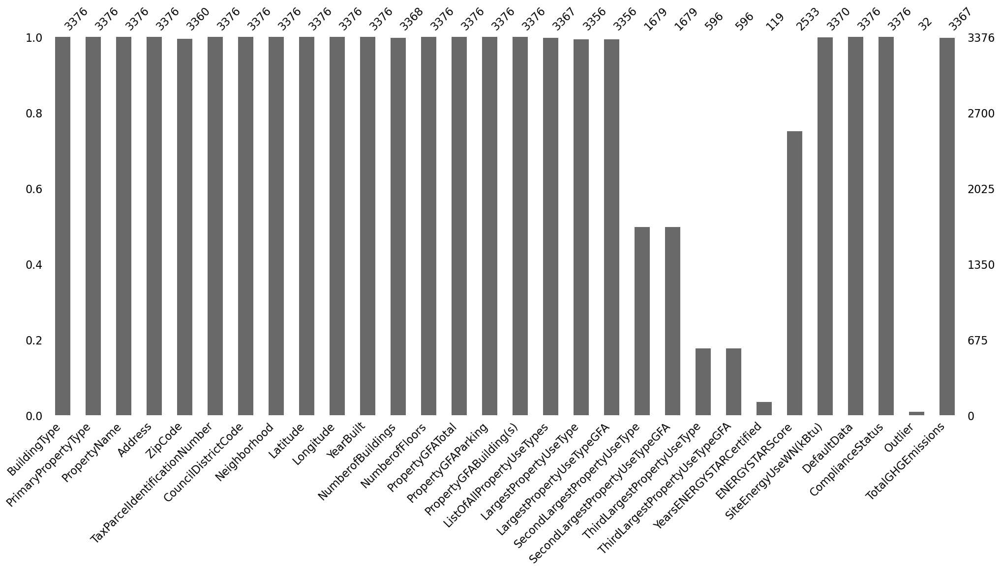

In [26]:
#les variables misc_data
import missingno as msno
msno.bar(df_cleaned);

#### les données manquantes des variables géographiques

###### ZipCode

Les valeurs manquantes de la colonnes zipcode sont obtenues grace à une recherche internet à partir de leur addresse

In [27]:
# https://www.gps-coordinates.net/
# https://www.latlong.net/Show-Latitude-Longitude.html
# https://www.findlatitudeandlongitude.com/find-address-from-latitude-and-longitude/

df_cleaned.loc[df_cleaned.Address=='10510 5th Ave NE','ZipCode'] = 98125.0
df_cleaned.loc[df_cleaned.Address=='405 MLK Jr Way S','ZipCode'] = 98144.0
df_cleaned.loc[df_cleaned.Address=='8729 15th Ave NW','ZipCode'] = 98117.0
df_cleaned.loc[df_cleaned.Address=='2806 NE 127th St','ZipCode'] = 98125.0
df_cleaned.loc[df_cleaned.Address=='6020 28th ave NW','ZipCode'] = 98107.0
df_cleaned.loc[df_cleaned.Address=='1471 NW 67th St','ZipCode'] = 98117.0
df_cleaned.loc[df_cleaned.Address=='1403 w howe','ZipCode'] = 98119.0
df_cleaned.loc[df_cleaned.Address=='1400 E Galer St','ZipCode'] = 98112.0
df_cleaned.loc[df_cleaned.Address=='2323 East Cherry St','ZipCode'] = 98122.0
df_cleaned.loc[df_cleaned.Address=='4420 S Genesee','ZipCode'] = 98118.0
df_cleaned.loc[df_cleaned.Address=='6920 34th Ave SW','ZipCode'] = 98126.0
df_cleaned.loc[df_cleaned.Address=='1600 S Dakota St','ZipCode'] = 98108.0
df_cleaned.loc[df_cleaned.Address=='719 8th Ave S','ZipCode'] = 98114.0
df_cleaned.loc[df_cleaned.Address=='1920 1st Ave W','ZipCode'] = 98119.0
df_cleaned.loc[df_cleaned.Address=='8319 8th Ave S','ZipCode'] = 98108.0
df_cleaned.loc[df_cleaned.Address=='2820 S Myrtle St','ZipCode'] = 98108.0

In [28]:
# Convert ZipCode to string because its not numerical values
df_cleaned['ZipCode'] = df_cleaned.ZipCode.apply(int).apply(str)

###### CouncilDistrictCode

In [29]:
df_cleaned['CouncilDistrictCode'] = df_cleaned.CouncilDistrictCode.apply(int).apply(str)

###### SecondLargestPropertyUseType & ThirdLargestPropertyUseType

In [30]:
df.LargestPropertyUseType.nunique(),df.SecondLargestPropertyUseType.nunique(),df.ThirdLargestPropertyUseType.nunique()

(56, 50, 44)

In [31]:
df_cleaned.loc[df_cleaned.SecondLargestPropertyUseType.isna(),'SecondLargestPropertyUseType'] = 'void'
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseType.isna(),'ThirdLargestPropertyUseType'] = 'void'

###### SecondLargestPropertyUseTypeGFA & ThirdLargestPropertyUseTypeGFA

In [32]:
# remplacement des valeurs nulles par 0
df_cleaned.loc[df_cleaned.SecondLargestPropertyUseTypeGFA.isna(),'SecondLargestPropertyUseTypeGFA'] = 0
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseTypeGFA.isna(),'ThirdLargestPropertyUseTypeGFA'] = 0

In [33]:
def compute_nb_mising_values(data):
    """
    Cree un dataframe pandas qui contient le nombre de valeurs par colonnes de l'argument data
    """
    valeurs = {}
    
    for col in data.columns:
        valeurs[col] = []
        valeurs[col].append(round((data[col].notna().sum()/data.shape[0])*100,2))
        valeurs[col].append(data[col].isna().sum())
        
    return pd.DataFrame.from_dict(data=valeurs, orient='index',
                                  columns = ["Taux de valeurs non nulles", "Nombre de valeurs manquantes"]
                                 ).sort_values(by="Nombre de valeurs manquantes",ascending=True)

In [34]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
ComplianceStatus,100.00,0
DefaultData,100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
PropertyGFABuilding(s),100.00,0
PropertyGFATotal,100.00,0
NumberofFloors,100.00,0


In [35]:
df_cleaned.shape

(3376, 30)

In [36]:
# Suppression des lignes sont valeurs pour nos variables cibles
df_cleaned = df_cleaned[~((df_cleaned['SiteEnergyUseWN(kBtu)'].isna()) | (df_cleaned['TotalGHGEmissions'].isna()))]
df_cleaned.shape

(3366, 30)

In [37]:
df_cleaned.Outlier.value_counts()

Low outlier     23
High outlier     9
Name: Outlier, dtype: int64

In [38]:
# suppression des outliers de la colonnes Outliers
df_cleaned = df_cleaned[df_cleaned.Outlier.isna()]

In [39]:
df_cleaned.shape

(3334, 30)

#### <div class="alert alert-info"><font color='teal'> Suppression des colonnes dont plus de 50% des valeurs sont manquantes </font></div>

In [40]:
def drop_NA_columns(data,p):
    '''
    Select features who have more than p% if p<1 na value   
    Select feature contains more than p na value if p>1
    '''
    feature = []
    if p > 1 and p < 100:
        na_df = data.columns[data.isna().sum() > int(p)]
    
    if p <= 1 and p > 0:
        na_df = data.columns[data.isna().sum()/data.shape[0] > p]
    
    return(na_df)

In [41]:
# Ci dessous la liste des colonnes qui seront supprimées
drop_NA_columns(df_cleaned,p=0.49)

Index(['YearsENERGYSTARCertified', 'Outlier'], dtype='object')

In [42]:
col_to_drop = drop_NA_columns(df_cleaned,p=0.49)
df_cleaned.shape

(3334, 30)

In [43]:
df_cleaned = df_cleaned.drop(columns=col_to_drop,inplace=False)
df_cleaned.shape

(3334, 28)

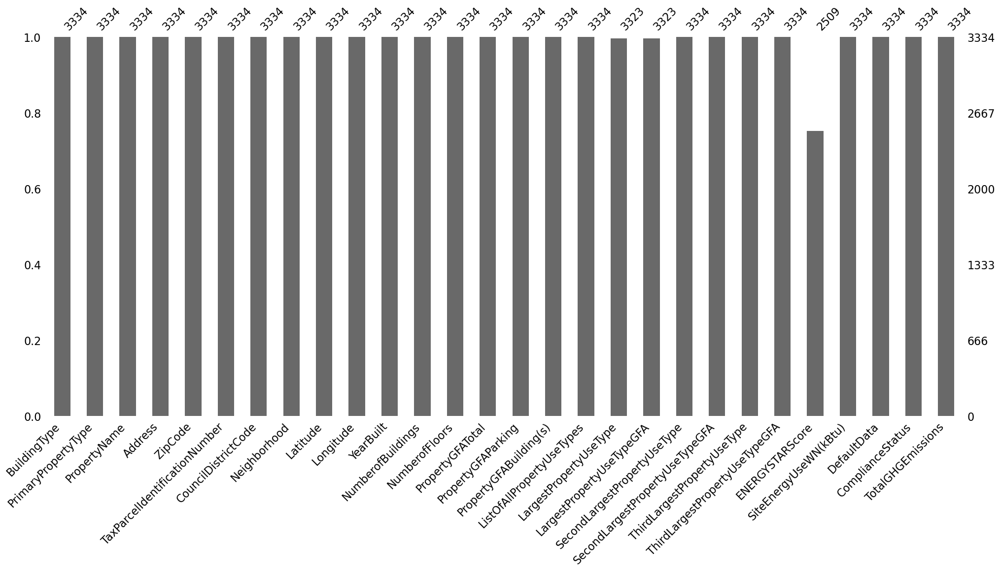

In [44]:
#les variables misc_data
import missingno as msno
msno.bar(df_cleaned);

In [45]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
DefaultData,100.00,0
SiteEnergyUseWN(kBtu),100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
ListOfAllPropertyUseTypes,100.00,0
PropertyGFABuilding(s),100.00,0
PropertyGFAParking,100.00,0


#### <font color='teal'> Imputation des données manquantes Categorielle</font>

In [46]:
from sklearn.preprocessing import StandardScaler

In [47]:
%%time
from sklearn.model_selection import KFold


def do_cross_validation_Cat(df,imputer, print_model=False,Nbsplit = 6):
    
    # Deux imputer fourni par sklearn seront testés.
    # Un jeu d'entrainement A qui représente 20% sera tiré de façon aléatoire à partir de notre dataset.
    # Des valeurs manquantes seront générées aléatoirement dans A.
    # La metrique de comparaison des imputer sera le RMSE et le MAE.

    ## Create dataset without Nas
    na_df = df.select_dtypes(exclude=np.number).dropna().copy().values

    # Create Index
    idNan = np.arange(na_df.size)

    # Generate idx Nas
    idNan = np.random.choice(idNan, size=round((na_df.shape[0] * na_df.shape[1])*0.2), replace=False)

    ## Create train Nas dataset
    Xna = na_df.ravel()
    Xna = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna) ]).reshape(na_df.shape)
    
    # cross validate
    kf = KFold(n_splits=Nbsplit)
    
    # list des score
    score_rmse = []
    score_mae = []
    
    for train, test in kf.split(na_df):
        # Create Index
        idNan = train.size

        # Generate idx Nas
        idNan = np.random.choice(idNan, size=int(round(len(train)*0.4,0)), replace=False)

        ## Create train Nas dataset
        Xna_train = na_df[train].ravel()
        Xna_train = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_train) ]).reshape(na_df[train].shape)
        
        ## Create test Nas dataset
        Xna_test = na_df[test].ravel()
        Xna_test = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_test) ]).reshape(na_df[test].shape)
        
        
        ## Fit imputer
        imputer.fit( Xna_train )
        
        ## transform X
        X_Imputer = imputer.transform( Xna_test )

        score_accuracy.append( accuracy_score( na_df[test].ravel() , X_Imputer.ravel(), normalize=True)  )
        
        
    mean_accuracy = np.mean(score_accuracy)
    
    std_accuracy = np.std(score_accuracy)
    
    scoresAccuracy = ' + '.join(f'{s:.2f}' for s in score_accuracy)
    msg = f'Cross-validated rmse: ({scoresAccuracy}) / 3 = {mean_accuracy:.2f}'
    
    if print_model:
        msg = f'{imputer}:\n\t{msg}\n'
    
    print(msg)

CPU times: total: 0 ns
Wall time: 0 ns


#### <font color='teal'> Imputation des données numériques manquantes</font>

In [48]:
%%time
from sklearn.model_selection import KFold

def do_cross_validation_Num(df,imputer, print_model=False,Nbsplit = 6):
    
    
    # Deux imputer fourni par sklearn seront testés.
    # Un jeu d'entrainement A qui représente 20% sera tiré de façon aléatoire à partir de notre dataset.
    # Des valeurs manquantes seront générées aléatoirement dans A.
    # La metrique de comparaison des imputer sera le RMSE et le MAE.

    ## Create dataset without Nas
    na_df = df.select_dtypes(include=np.number).dropna().copy()

    # Scaling Data
    Scaler = StandardScaler().fit(na_df)
    na_df = Scaler.transform(na_df)

    # Create Index
    idNan = np.arange(na_df.size)

    # Generate idx Nas
    idNan = np.random.choice(idNan, size=round((na_df.shape[0] * na_df.shape[1])*0.2), replace=False)

    ## Create train Nas dataset
    Xna = na_df.ravel()
    Xna = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna) ]).reshape(na_df.shape)
    
    # shape 
    n = na_df.shape[0]
    p = na_df.shape[1]
    
    # cross validate
    kf = KFold(n_splits=Nbsplit)
    
    # list des score
    score_rmse = []
    score_mae = []
    
    for train, test in kf.split(na_df):
        # Create Index
        idNan = train.size

        # Generate idx Nas
        idNan = np.random.choice(idNan, size=int(round(len(train)*0.4,0)), replace=False)

        ## Create train Nas dataset
        Xna_train = na_df[train].ravel()
        Xna_train = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_train) ]).reshape(na_df[train].shape)
        
        ## Create test Nas dataset
        Xna_test = na_df[test].ravel()
        Xna_test = np.array([ np.nan if i in idNan else x for i,x in enumerate(Xna_test) ]).reshape(na_df[test].shape)
        
        
        ## Fit imputer
        imputer.fit( Xna_train )
        
        ## transform X
        X_Imputer = imputer.transform( Xna_test )

        score_rmse.append( mean_squared_error( na_df[test].ravel() , X_Imputer.ravel() ) )
        score_mae.append( mean_absolute_error( na_df[test].ravel() , X_Imputer.ravel() ) )
        
    mean_rmse = np.mean(score_rmse)
    mean_mae  = np.mean(score_mae)
    
    std_rmse = np.std(score_rmse)
    std_mae  = np.std(score_mae)
    
    scoresRMSE = ' + '.join(f'{s:.2f}' for s in score_rmse)
    scoresMAE = ' + '.join(f'{s:.2f}' for s in score_mae)
    msg = f'Cross-validated rmse: ({scoresRMSE}) / 3 = {mean_rmse:.2f}'
    
    if print_model:
        msg = f'{imputer}:\n\t{msg}\n'
    
    print(msg)

CPU times: total: 0 ns
Wall time: 0 ns


In [49]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = SimpleImputer( strategy='mean'), 
                        print_model=False,
                        Nbsplit = 6)

Cross-validated rmse: (0.61 + 0.25 + 0.08 + 0.06 + 0.07 + 0.06) / 3 = 0.19


In [50]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = KNNImputer(n_neighbors=3, weights="distance"),
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.51 + 0.21 + 0.23 + 0.13 + 0.21 + 0.16) / 3 = 0.24


In [51]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = KNNImputer(n_neighbors=5, weights="distance"), 
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.58 + 0.31 + 0.15 + 0.09 + 0.11 + 0.13) / 3 = 0.23


In [52]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = KNNImputer(n_neighbors=10, weights="distance"), 
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.70 + 0.19 + 0.10 + 0.41 + 0.12 + 0.12) / 3 = 0.27


In [53]:
do_cross_validation_Num(df=df_cleaned,
                        imputer = IterativeImputer(max_iter=500, random_state=0),
                        print_model=False, Nbsplit = 6)

Cross-validated rmse: (0.15 + 0.11 + 0.15 + 0.04 + 0.07 + 0.06) / 3 = 0.10


###### <font color='teal'>Selection de l'algorithme d'imputation</font>

In [54]:
df_cleaned.select_dtypes(exclude = np.number).info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3334 entries, 1 to 50226
Data columns (total 14 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   BuildingType                   3334 non-null   object
 1   PrimaryPropertyType            3334 non-null   object
 2   PropertyName                   3334 non-null   object
 3   Address                        3334 non-null   object
 4   ZipCode                        3334 non-null   object
 5   TaxParcelIdentificationNumber  3334 non-null   object
 6   CouncilDistrictCode            3334 non-null   object
 7   Neighborhood                   3334 non-null   object
 8   ListOfAllPropertyUseTypes      3334 non-null   object
 9   LargestPropertyUseType         3323 non-null   object
 10  SecondLargestPropertyUseType   3334 non-null   object
 11  ThirdLargestPropertyUseType    3334 non-null   object
 12  DefaultData                    3334 non-null   bool  
 13  Co

In [55]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
DefaultData,100.00,0
SiteEnergyUseWN(kBtu),100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
ListOfAllPropertyUseTypes,100.00,0
PropertyGFABuilding(s),100.00,0
PropertyGFAParking,100.00,0


### <a name="C34"><font color='teal'>3.4 Data inspections</font></a> 

In [56]:
def plot_kde(feature,log_ = True):
    X = df_cleaned.copy()
    if log_:
        X['TotalGHGEmissions'] = np.log1p(X['TotalGHGEmissions'])
        X['SiteEnergyUseWN(kBtu)'] = np.log1p(X['SiteEnergyUseWN(kBtu)'])
    
    fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
    
    sns.kdeplot(data=X,x ='TotalGHGEmissions',hue= feature,ax=axes[0])
    axes[0].set_title(f'TotalGHGEmissions')
    sns.move_legend(axes[0], "upper left", bbox_to_anchor=(1, 1))
    
    sns.kdeplot(data=X,x ='SiteEnergyUseWN(kBtu)',hue= feature,ax=axes[1],legend = False)
    axes[1].set_title(f'SiteEnergyUseWN(kBtu)')
    
    plt.xlabel('')

In [57]:
# Inspections des données numériques
df_cleaned.describe()

,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEnergyUseWN(kBtu),TotalGHGEmissions
count,3334.000000,3334.000000,3334.000000,3334.000000,3334.000000,3.334000e+03,3334.000000,3.334000e+03,3.323000e+03,3334.000000,3334.000000,2509.000000,3.334000e+03,3334.000000
mean,47.624196,-122.334737,1968.744151,1.106479,4.717756,9.538439e+04,8046.108278,8.733828e+04,7.947742e+04,14240.896310,2087.201979,67.819450,5.291036e+06,120.112127
std,0.047823,0.027166,33.022730,2.117973,5.514333,2.201099e+05,32482.974212,2.091591e+05,2.026400e+05,41108.179369,13178.155694,26.708489,1.600033e+07,541.245384
min,47.499170,-122.414250,1900.000000,0.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,0.000000e+00,-0.800000
25%,47.600120,-122.350527,1948.250000,1.000000,2.000000,2.853475e+04,0.000000,2.779400e+04,2.514850e+04,0.000000,0.000000,53.000000,9.858907e+05,9.652500
50%,47.618835,-122.332460,1975.000000,1.000000,4.000000,4.445400e+04,0.000000,4.335500e+04,3.996000e+04,0.000000,0.000000,75.000000,1.916639e+06,34.095000
75%,47.657232,-122.319383,1997.000000,1.000000,5.000000,9.144325e+04,0.000000,8.469850e+04,7.662750e+04,10636.250000,0.000000,90.000000,4.381429e+06,93.975000
max,47.733870,-122.220966,2015.000000,111.000000,99.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,686750.000000,459748.000000,100.000000,4.716139e+08,16870.980000


In [58]:
df_cleaned.drop(columns=['PropertyName','TaxParcelIdentificationNumber'],inplace=True)

##### NumberofBuildings

In [59]:
df_cleaned.NumberofBuildings.value_counts().sort_index()

0.0        92
1.0      3143
2.0        36
3.0        22
4.0        12
5.0         9
6.0         5
7.0         1
8.0         3
9.0         2
10.0        2
11.0        1
14.0        2
16.0        1
23.0        1
27.0        1
111.0       1
Name: NumberofBuildings, dtype: int64

In [60]:
df.loc[df.NumberofBuildings==df.NumberofBuildings.min(),['NumberofBuildings','BuildingType','PrimaryPropertyType','PropertyName','Address','Latitude','Longitude','ZipCode']]

,NumberofBuildings,BuildingType,PrimaryPropertyType,PropertyName,Address,Latitude,Longitude,ZipCode
63,0.0,NonResidential,Medical Office,Polyclinic North && South,1200 Harvard Ave,47.61244,-122.32140,98122.0
76,0.0,NonResidential,Small- and Mid-Sized Office,KCTS9,401 Mercer St,47.62391,-122.34837,98109.0
160,0.0,NonResidential,Warehouse,Harbor Island: Warehouse E - DNRP-SWD,3235 16TH AVE SW,47.57507,-122.35747,98134.0
201,0.0,NonResidential,Large Office,Cox Media Group Seattle KIRO TV (322),2801 3rd Ave,47.61757,-122.35122,98121.0
241,0.0,NonResidential,Small- and Mid-Sized Office,University District Office Buiding,1107 NE 45th St,47.66100,-122.31626,98105.0
...,...,...,...,...,...,...,...,...
3184,0.0,Multifamily MR (5-9),Mid-Rise Multifamily,Oakwood SeattleSouth LakeUnion (Hue),717 Dexter Ave North,47.62600,-122.34278,98109.0
3202,0.0,Multifamily MR (5-9),Mid-Rise Multifamily,Ernestine Anderson Place,2010 S Jackson Street,47.59946,-122.30561,98144.0
3205,0.0,NonResidential,Laboratory,UW Medicine Phase 3.1,750 Republican Street,47.62351,-122.34135,98109.0
3232,0.0,Nonresidential COS,Other,SCT Technical Pavilion,201 Thomas St.,47.62082,-122.35251,98109.0


In [61]:
df_cleaned.loc[df_cleaned.NumberofBuildings==0,['NumberofBuildings']] = np.nan
#df_cleaned.NumberofBuildings.apply(lambda x: x if x>0 else 1)

##### NumberofFloors

In [62]:
df_cleaned.NumberofFloors.value_counts().sort_index()

0      16
1     462
2     433
3     681
4     678
5     294
6     305
7     145
8      63
9      18
10     32
11     32
12     21
13     21
14     13
15      7
16      7
17      9
18      7
19      6
20      5
21      5
22      4
23      7
24      6
25      5
26      6
27      5
28      2
29      3
30      1
31      2
32      1
33      6
34      2
36      2
37      2
38      1
39      1
40      1
41      3
42      6
46      1
47      1
49      1
55      1
56      1
63      1
76      1
99      1
Name: NumberofFloors, dtype: int64

In [63]:
df.loc[df.NumberofFloors==df.NumberofFloors.min(),['NumberofFloors','BuildingType','PrimaryPropertyType','PropertyName','Address','City','State','ZipCode']]

,NumberofFloors,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode
166,0,NonResidential,Hotel,Grand Hyatt Seattle,721 Pine St,Seattle,WA,98101.0
487,0,NonResidential,Medical Office,Arnold Pavilion,1221 Madison Street,Seattle,WA,98104.0
488,0,NonResidential,Mixed Use Property,2200 Westlake - SEDO,2200 Westlake Ave.,Seattle,WA,98121.0
564,0,NonResidential,Other,Pacific Place,600 Pine Street,Seattle,WA,98101.0
1754,0,NonResidential,Medical Office,HART First Hill LLC,1124 Columbia Street,Seattle,WA,98104.0
1993,0,Campus,Other,(ID#24086)Campus1:KC Metro Transit Atlantic Ce...,1333 AIRPORT WAY S,Seattle,WA,98134.0
3130,0,NonResidential,Warehouse,Sandpoint #5,7561 63rd Ave NE,Seattle,WA,98115.0
3131,0,NonResidential,Medical Office,Sandpoint #25,6222 NE 74th St,Seattle,WA,98115.0
3132,0,NonResidential,Small- and Mid-Sized Office,Sandpoint #29,6200 NE 74th ST,Seattle,WA,98115.0
3168,0,Nonresidential COS,Other,Magnuson,7400 Sand Point Way NE,Seattle,WA,98115.0


In [64]:
# etage 0 equivaut à un batiment sans etage
# df_cleaned['NumberofFloors']=df_cleaned.NumberofFloors.apply(lambda x: x if x>0 else 1)

In [65]:
df_cleaned.loc[df_cleaned.NumberofFloors==0,['NumberofFloors']] = np.nan

###### Etude de la colonne ListOfAllPropertyUseTypes

In [66]:
df_cleaned['ListOfAllPropertyUseTypes'] = df_cleaned.ListOfAllPropertyUseTypes.str.lower()

# remplacement des modalité possedant des ,
df_cleaned['ListOfAllPropertyUseTypes'] = df_cleaned.ListOfAllPropertyUseTypes.str.replace('repair services (vehicle, shoe, locksmith, etc)','repair services (vehicle shoe locksmith etc)',regex=False)
df_cleaned['ListOfAllPropertyUseTypes'] = df_cleaned.ListOfAllPropertyUseTypes.str.replace('personal services (health/beauty, dry cleaning, etc)','personal services (health/beauty dry cleaning etc)',regex=False)

In [67]:
pd.options.display.max_colwidth = 400
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseType == 'void',['ListOfAllPropertyUseTypes','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']]\
.loc[df_cleaned.ListOfAllPropertyUseTypes.apply(lambda x: len(str(x).split(', '))>2)].drop_duplicates()

,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType
OSEBuildingID,,,,
393,"office, parking, personal services (health/beauty dry cleaning etc)",Parking,Office,void
496,"fitness center/health club/gym, office, other - education, other - recreation, other - restaurant/bar, outpatient rehabilitation/physical therapy, personal services (health/beauty dry cleaning etc), restaurant, retail store, self-storage facility, vocat",NaN,void,void
655,"multifamily housing, other - lodging/residential, parking",Multifamily Housing,void,void
50014,"multifamily housing, parking, restaurant",Multifamily Housing,Parking,void


In [68]:
# Separer la colonnes ListOfAllPropertyUseTypes
complement = df_cleaned.ListOfAllPropertyUseTypes.str.split(', ',expand=True,).iloc[:,:6]

In [69]:
# Completer les "ThirdLargestPropertyUseType" qui sont manquant
df_cleaned.loc[((df_cleaned.LargestPropertyUseType=='void') & (~complement[0].isnull() ) ),'LargestPropertyUseType'] = complement.loc[((df_cleaned.LargestPropertyUseType=='void') & (~complement[0].isnull() ) ),0]

In [70]:
# Completer les "ThirdLargestPropertyUseType" qui sont manquant
df_cleaned.loc[((df_cleaned.ThirdLargestPropertyUseType=='void') & (~complement[2].isnull() ) ),'ThirdLargestPropertyUseType'] = complement.loc[((df_cleaned.ThirdLargestPropertyUseType=='void') & (~complement[2].isnull() ) ),2]

In [71]:
# Completer les "SecondLargestPropertyUseType" qui sont manquant
df_cleaned.loc[((df_cleaned.SecondLargestPropertyUseType=='void') & (~complement[1].isnull() ) ),'SecondLargestPropertyUseType'] = complement.loc[((df_cleaned.SecondLargestPropertyUseType=='void') & (~complement[1].isnull() ) ),1]

### Creation de la colonnes nombres de usetype total

In [72]:
df_cleaned['NbTotalUseType'] = df_cleaned.ListOfAllPropertyUseTypes.str.split(', ',expand=True,).T.notna().sum()

### Creation des colonnes FourthLargestPropertyUseType , FifthLargestPropertyUseType , SixthLargestPropertyUseType

In [73]:
df_cleaned[['FourthLargestPropertyUseType','FifthLargestPropertyUseType','SixthLargestPropertyUseType']] = complement.iloc[:,3:6]

In [74]:
df_cleaned.loc[df_cleaned.FourthLargestPropertyUseType.isnull(),['FourthLargestPropertyUseType']] = "void"
df_cleaned.loc[df_cleaned.FifthLargestPropertyUseType.isnull(),['FifthLargestPropertyUseType']] = "void"
df_cleaned.loc[df_cleaned.SixthLargestPropertyUseType.isnull(),['SixthLargestPropertyUseType']] = "void"

In [75]:
del complement

In [76]:
df_cleaned.drop(columns=['ListOfAllPropertyUseTypes'],inplace=True)
df_cleaned.shape

(3334, 29)

###### Etude de la colonne ComplianceStatus

In [77]:
df_cleaned.ComplianceStatus.str.lower().value_counts()

compliant                       3206
error - correct default data     111
missing data                      15
non-compliant                      2
Name: ComplianceStatus, dtype: int64

#### <div class="alert alert-info"><font color='teal'> Suppression de lignes non Compliants (conformes)</font></div>

In [78]:
df_cleaned = df_cleaned.loc[df_cleaned.ComplianceStatus=='Compliant']
df_cleaned.shape

(3206, 29)

###### Creation de la colonne age à partir de YearBuilt

In [79]:
df_cleaned['Age'] = 2016-df_cleaned.YearBuilt
df_cleaned.drop(columns=['YearBuilt','ComplianceStatus'],inplace=True)
df_cleaned.shape

(3206, 28)

In [80]:
df_cleaned.select_dtypes(exclude=np.number).describe()

,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,DefaultData,FourthLargestPropertyUseType,FifthLargestPropertyUseType,SixthLargestPropertyUseType
count,3206,3206,3206,3206,3206,3206,3195,3206,3206,3206,3206,3206,3206
unique,8,23,3184,55,7,19,55,53,49,1,30,21,14
top,NonResidential,Low-Rise Multifamily,2600 SW Barton St,98109,7,DOWNTOWN,Multifamily Housing,void,void,False,void,void,void
freq,1431,952,4,291,1010,555,1626,1557,2619,3206,2993,3116,3171


In [81]:
#Suppression de DefaultData qui est une variable constante
df_cleaned.drop(columns=['DefaultData'],inplace=True)
df_cleaned.shape

(3206, 27)

## Etude des variables catégorielles

In [82]:
# Inspections des données non numériques
df_cleaned.select_dtypes(exclude=np.number).describe()

,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,FourthLargestPropertyUseType,FifthLargestPropertyUseType,SixthLargestPropertyUseType
count,3206,3206,3206,3206,3206,3206,3195,3206,3206,3206,3206,3206
unique,8,23,3184,55,7,19,55,53,49,30,21,14
top,NonResidential,Low-Rise Multifamily,2600 SW Barton St,98109,7,DOWNTOWN,Multifamily Housing,void,void,void,void,void
freq,1431,952,4,291,1010,555,1626,1557,2619,2993,3116,3171


#### BuildingType

In [83]:
df_cleaned.BuildingType.str.lower().value_counts()

nonresidential          1431
multifamily lr (1-4)     981
multifamily mr (5-9)     570
multifamily hr (10+)     108
nonresidential cos        81
campus                    24
sps-district k-12         10
nonresidential wa          1
Name: BuildingType, dtype: int64

#### Regroupement des modalités rares
- Nonresidential WA

In [84]:
df_cleaned.select_dtypes(exclude=np.number).loc[df_cleaned.BuildingType=="Nonresidential WA"]

,BuildingType,PrimaryPropertyType,Address,ZipCode,CouncilDistrictCode,Neighborhood,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,FourthLargestPropertyUseType,FifthLargestPropertyUseType,SixthLargestPropertyUseType
OSEBuildingID,,,,,,,,,,,,
50101,Nonresidential WA,University,4331 Memorial Way NE,98195,4,NORTHEAST,College/University,void,void,void,void,void


In [85]:
# PrimaryPropertyType
print("La modalité la plus représenté parmi les batiment dt le PrimaryPropertyType = 'University' est :",
df_cleaned.loc[df_cleaned.PrimaryPropertyType=="University",'BuildingType'].value_counts().index[0])

# ListOfAllPropertyUseTypes
#print("La modalité la plus représenté parmi les batiment dt le ListOfAllPropertyUseTypes = 'College/University' est :",
#df_cleaned.loc[df_cleaned.ListOfAllPropertyUseTypes=="College/University",'BuildingType'].value_counts().index[0])

# LargestPropertyUseType
print("La modalité la plus représenté parmi les batiment dt le LargestPropertyUseType = 'College/University' est :",
      df_cleaned.loc[df_cleaned.LargestPropertyUseType=="College/University",'BuildingType'].value_counts().index[0]
     )

La modalité la plus représenté parmi les batiment dt le PrimaryPropertyType = 'University' est : NonResidential
La modalité la plus représenté parmi les batiment dt le LargestPropertyUseType = 'College/University' est : NonResidential


In [86]:
# Les deux valeurs sont proche donc sans crainte on peut remplacer "Nonresidential WA" par 'NonResidential'
df_cleaned.loc[df_cleaned.BuildingType=="Nonresidential WA",'BuildingType'] = 'NonResidential'

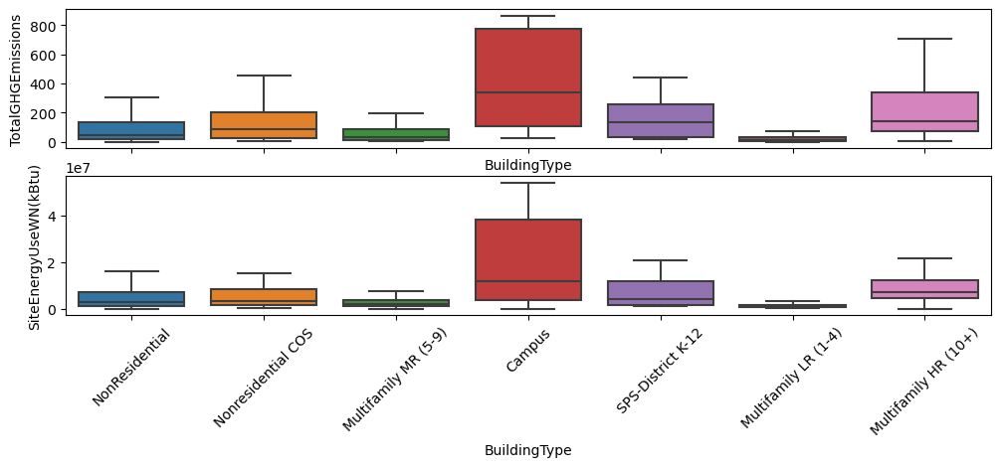

In [87]:
# BuildingType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned,x='BuildingType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='BuildingType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

In [88]:
### Les modalités df_cleaned.BuildingType.str.lower() NonResidential Cos deviennet NonResidential

In [89]:
# Les deux valeurs sont proche donc sans crainte on peut remplacer "Nonresidential WA" par 'NonResidential'
df_cleaned.loc[df_cleaned.BuildingType.str.lower()=="nonresidential cos",'BuildingType'] = 'NonResidential'

In [90]:
def plot_kde(feature,log_ = True):
    X = df_cleaned.copy()
    if log_:
        X['TotalGHGEmissions'] = np.log1p(X['TotalGHGEmissions'])
        X['SiteEnergyUseWN(kBtu)'] = np.log1p(X['SiteEnergyUseWN(kBtu)'])
    
    fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
    
    sns.kdeplot(data=X,x ='TotalGHGEmissions',hue= feature,ax=axes[0])
    axes[0].set_title(f'TotalGHGEmissions')
    sns.move_legend(axes[0], "upper left", bbox_to_anchor=(1, 1))
    
    sns.kdeplot(data=X,x ='SiteEnergyUseWN(kBtu)',hue= feature,ax=axes[1],legend = False,warn_singular=False)
    axes[1].set_title(f'SiteEnergyUseWN(kBtu)')
    
    plt.xlabel('')

##### Lattitude longitude

In [91]:
import plotly.express as px

color_scale = [(0, 'orange'), (1,'red')]
df_out = df_cleaned[df_cleaned['SiteEnergyUseWN(kBtu)'].notna()].dropna(axis='columns')

from sklearn.preprocessing import StandardScaler
elect_scalMM = (df_out['SiteEnergyUseWN(kBtu)'] - df_out['SiteEnergyUseWN(kBtu)'].mean(axis=0)) / (df_out['SiteEnergyUseWN(kBtu)'].std(axis=0))
fig = px.scatter_mapbox(df_out, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="Address", 
                        hover_data=["Address", "SiteEnergyUseWN(kBtu)"],
                        color="SiteEnergyUseWN(kBtu)",
                        color_continuous_scale=color_scale,
                        size=elect_scalMM+1,
                        zoom=8, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [92]:
import plotly.express as px

color_scale = [(0, 'orange'), (1,'red')]
df_out = df_cleaned[df_cleaned['TotalGHGEmissions'].notna()].dropna(axis='columns')

from sklearn.preprocessing import StandardScaler
elect_scalMM = (df_out['TotalGHGEmissions'] - df_out['TotalGHGEmissions'].mean(axis=0)) / (df_out['TotalGHGEmissions'].std(axis=0))
fig = px.scatter_mapbox(df_out, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="Address", 
                        hover_data=["Address", "TotalGHGEmissions"],
                        color="TotalGHGEmissions",
                        color_continuous_scale=color_scale,
                        size=elect_scalMM+1,
                        zoom=8, 
                        height=800,
                        width=800)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
del df_out

### Creation de la distance entre les batiments et le centre de la ville

In [93]:
import math


def distance_Haversine(origin, destination):
    """
    Calculate the Haversine distance.

    Parameters
    ----------
    origin : tuple of float
        (lat, long)
    destination : tuple of float
        (lat, long)

    Returns
    -------
    distance_in_km : float

    Examples
    --------
    >>> origin = (48.1372, 11.5756)  # Munich
    >>> destination = (52.5186, 13.4083)  # Berlin
    >>> round(distance(origin, destination), 1)
    504.2
    """
    lat1, lon1 = origin
    lat2, lon2 = destination
    radius = 6371  # km

    dlat = math.radians(lat2 - lat1)
    dlon = math.radians(lon2 - lon1)
    a = (math.sin(dlat / 2) * math.sin(dlat / 2) +
         math.cos(math.radians(lat1)) * math.cos(math.radians(lat2)) *
         math.sin(dlon / 2) * math.sin(dlon / 2))
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    d = radius * c

    return d

In [94]:
df_cleaned['dist_mean'] = [round(distance_Haversine(origin=(df.Latitude.mean(),df.Longitude.mean()),destination=(lat,lon)) ,10) for lat,lon in zip(df_cleaned['Latitude'],df_cleaned['Longitude']) ]

#### creation distance en focntion du centre CouncilCode et Neighborhood

In [95]:
#df_cleaned['centre_councilcode_centre'] = 
#df.groupby(['CouncilDistrictCode'])[["Latitude","Longitude"]].mean().to_dict()

CouncilDistrictCode_GPSmean = {'Latitude': {1: 47.55379212804964,
  2: 47.56855520628684,
  3: 47.614997342869124,
  4: 47.661751607629434,
  5: 47.71387133136095,
  6: 47.67284457489878,
  7: 47.62130131147541},
 'Longitude': {1: -122.37228372482271,
  2: -122.31606504911592,
  3: -122.31649197550335,
  4: -122.31280228882834,
  5: -122.32431352071006,
  6: -122.36509380566801,
  7: -122.34829669238187}}

CouncilDistrictCode_GPSmean = {k:{str(kk):vv for kk,vv in v.items()} for k,v in CouncilDistrictCode_GPSmean.items()}

In [96]:
#data_temp = pd.DataFrame()
df_cleaned['CouncDistCode_meanLat'] = df_cleaned.CouncilDistrictCode.map( CouncilDistrictCode_GPSmean['Latitude'] )
df_cleaned['CouncDistCode_meanLong'] = df_cleaned.CouncilDistrictCode.map( CouncilDistrictCode_GPSmean['Longitude'] )

df_cleaned['dist_mean_CDC'] = [distance_Haversine(origin=(CDClat,CDClong), destination=(lat,lon))
for CDClat,CDClong,lat,lon in zip(df_cleaned['CouncDistCode_meanLat'], df_cleaned['CouncDistCode_meanLong'],
                                   df_cleaned['Latitude'],df_cleaned['Longitude']) ]

del df_cleaned['CouncDistCode_meanLat'],df_cleaned['CouncDistCode_meanLong']

<AxesSubplot:xlabel='dist_mean_CDC', ylabel='SiteEnergyUseWN(kBtu)'>

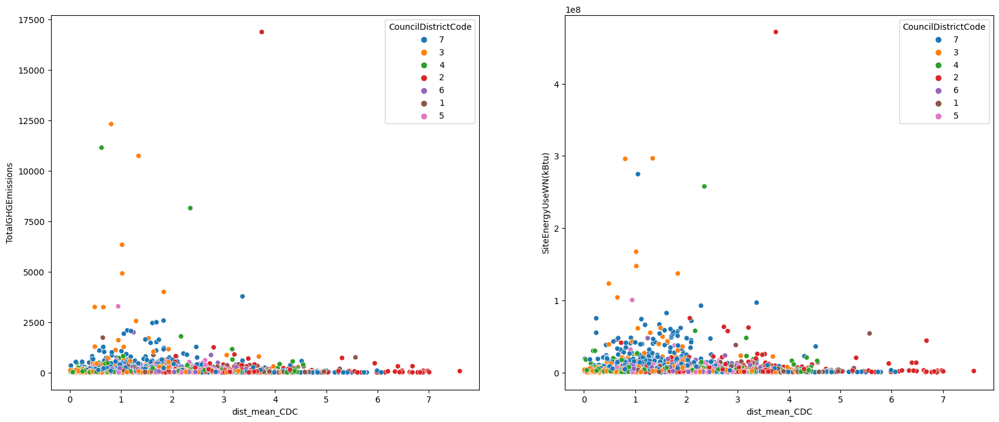

In [97]:
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))
sns.scatterplot(data=df_cleaned,x='dist_mean_CDC',y='TotalGHGEmissions',ax=axes[0],hue='CouncilDistrictCode')
sns.scatterplot(data=df_cleaned,x='dist_mean_CDC',y='SiteEnergyUseWN(kBtu)',ax=axes[1],hue='CouncilDistrictCode')


##### Address

In [98]:
df_cleaned.drop(columns=['Address'],inplace=True)
df_cleaned.shape

(3206, 28)

##### Neighborhood

In [99]:
df_cleaned.Neighborhood.str.lower().value_counts()

downtown                  555
east                      439
magnolia / queen anne     412
greater duwamish          357
northeast                 265
lake union                244
northwest                 208
north                     176
southwest                 147
ballard                   126
central                   121
southeast                  78
delridge                   77
delridge neighborhoods      1
Name: Neighborhood, dtype: int64

In [100]:
# On obtient 14 modalité en lower les valeurs
df_cleaned['Neighborhood'] = df_cleaned.Neighborhood.str.lower()
df_cleaned.loc[df_cleaned.Neighborhood=='delridge neighborhoods','Neighborhood'] = 'delridge'

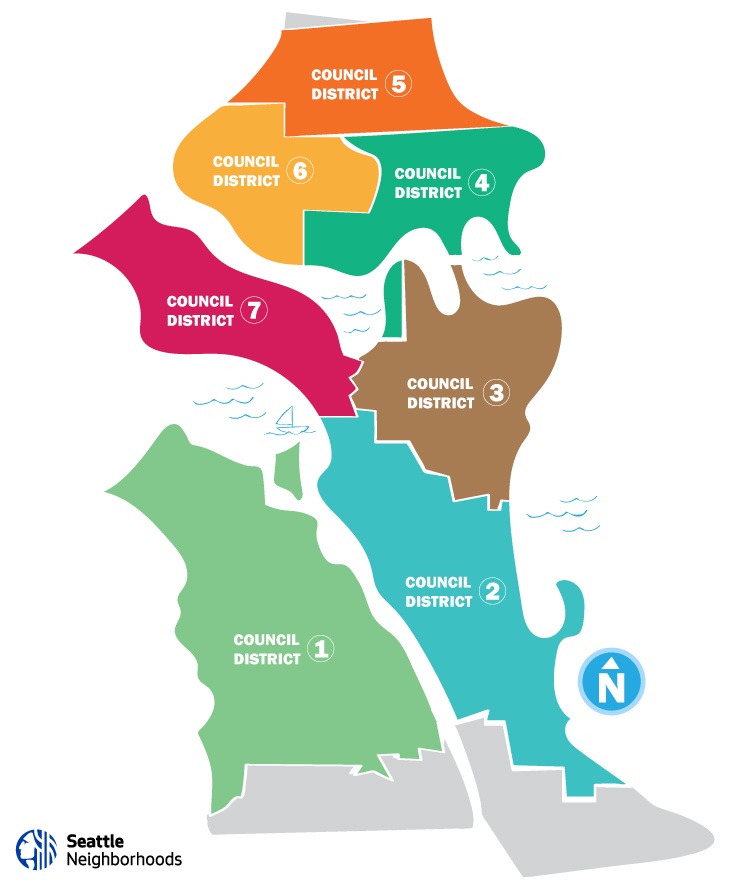

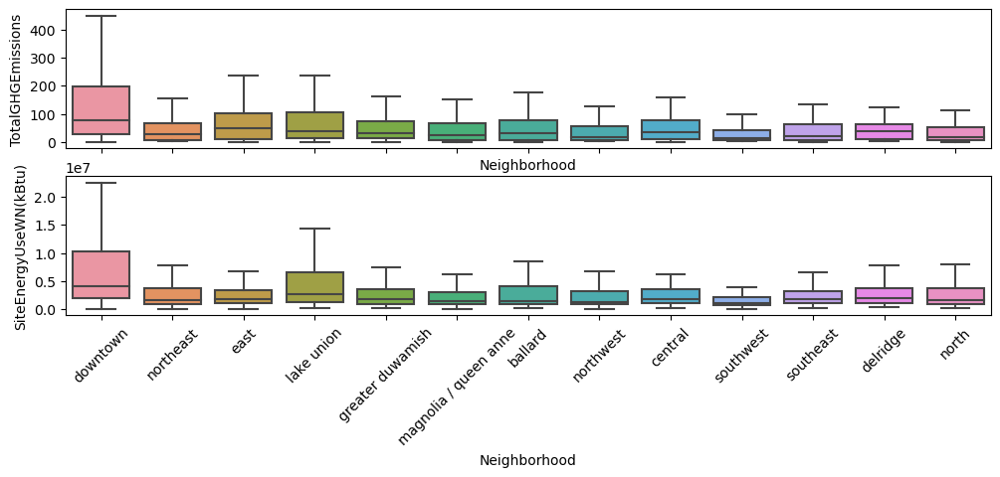

In [101]:
# Neighborhood
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned,x='Neighborhood',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='Neighborhood',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

##### Création de la distance entre chaq batiment et le centre de son Neighborhood

In [102]:
data_temp = df.copy()
data_temp['Neighborhood'] = data_temp.Neighborhood.str.lower()
data_temp.loc[data_temp.Neighborhood=='delridge neighborhoods','Neighborhood'] = 'delridge'

Neighborhood_GPSmean = data_temp.groupby(['Neighborhood'])[["Latitude","Longitude"]].mean().to_dict()
Neighborhood_GPSmean = {k:{str(kk):vv for kk,vv in v.items()} for k,v in Neighborhood_GPSmean.items()}

#data_temp = pd.DataFrame()
df_cleaned['Neighborhood_meanLat'] = df_cleaned.Neighborhood.map( Neighborhood_GPSmean['Latitude'] )
df_cleaned['Neighborhood_meanLong'] = df_cleaned.Neighborhood.map( Neighborhood_GPSmean['Longitude'] )

df_cleaned['dist_mean_Neigh'] = [distance_Haversine(origin=(CDClat,CDClong), destination=(lat,lon))
for CDClat,CDClong,lat,lon in zip(df_cleaned['Neighborhood_meanLat'], df_cleaned['Neighborhood_meanLong'],
                                   df_cleaned['Latitude'],df_cleaned['Longitude']) ]

del df_cleaned['Neighborhood_meanLat'],df_cleaned['Neighborhood_meanLong'],data_temp

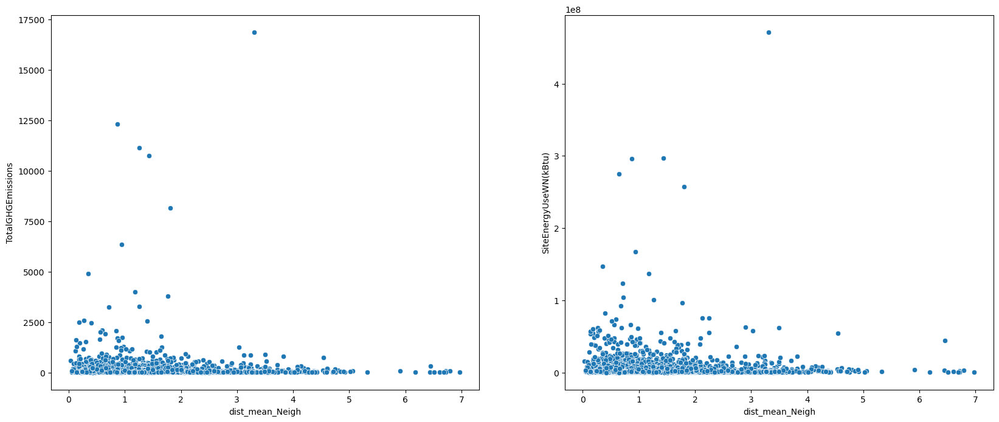

In [103]:
fig, axes = plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))
sns.scatterplot(data=df_cleaned,x='dist_mean_Neigh',y='TotalGHGEmissions',ax=axes[0])
sns.scatterplot(data=df_cleaned,x='dist_mean_Neigh',y='SiteEnergyUseWN(kBtu)',ax=axes[1]);

In [104]:
df_cleaned.corr()[['Age','Latitude','Longitude','dist_mean_CDC','dist_mean','dist_mean_Neigh','SiteEnergyUseWN(kBtu)','TotalGHGEmissions']]\
.T[['Latitude','Longitude','dist_mean_CDC','dist_mean','dist_mean_Neigh','SiteEnergyUseWN(kBtu)','TotalGHGEmissions']]\
.style.background_gradient(cmap = sns.color_palette("blend:white,green", as_cmap=True),axis=None)\
.format('{:.3f}')

,Latitude,Longitude,dist_mean_CDC,dist_mean,dist_mean_Neigh,SiteEnergyUseWN(kBtu),TotalGHGEmissions
Age,-0.127,0.052,-0.039,-0.183,-0.145,-0.069,-0.013
Latitude,1.000,0.016,-0.154,0.129,-0.064,-0.046,-0.029
Longitude,0.016,1.000,-0.013,0.052,0.032,0.035,0.039
dist_mean_CDC,-0.154,-0.013,1.000,0.450,0.645,-0.028,-0.024
dist_mean,0.129,0.052,0.450,1.000,0.419,-0.081,-0.050
dist_mean_Neigh,-0.064,0.032,0.645,0.419,1.000,-0.041,-0.026
SiteEnergyUseWN(kBtu),-0.046,0.035,-0.028,-0.081,-0.041,1.000,0.860
TotalGHGEmissions,-0.029,0.039,-0.024,-0.050,-0.026,0.860,1.000


##### PrimaryPropertyType

In [105]:
df_cleaned.PrimaryPropertyType.str.lower().value_counts()

low-rise multifamily           952
mid-rise multifamily           553
small- and mid-sized office    287
other                          250
warehouse                      185
large office                   168
mixed use property             132
high-rise multifamily          103
retail store                    85
hotel                           76
worship facility                69
distribution center             53
k-12 school                     50
senior care community           44
supermarket / grocery store     40
medical office                  39
self-storage facility           28
university                      25
residence hall                  23
refrigerated warehouse          12
restaurant                      12
hospital                        10
laboratory                      10
Name: PrimaryPropertyType, dtype: int64

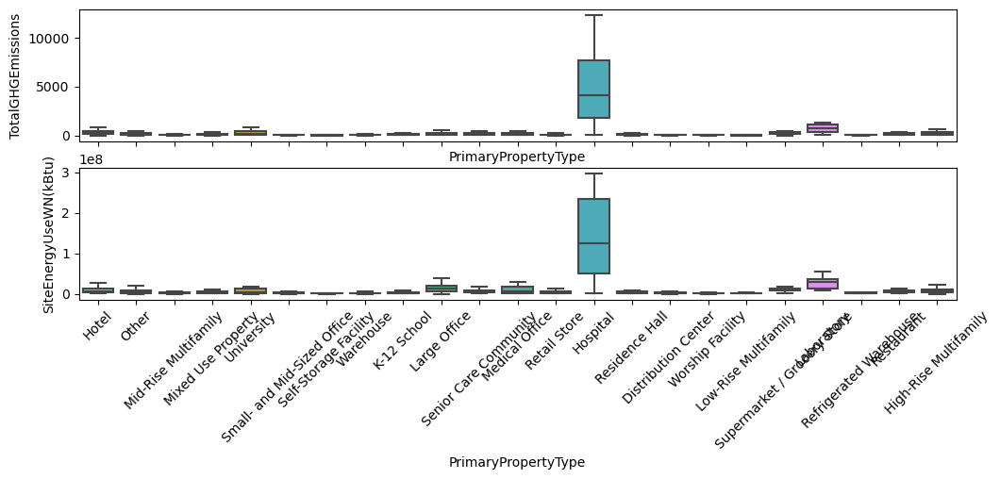

In [106]:
### PrimaryPropertyType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned,x='PrimaryPropertyType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='PrimaryPropertyType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

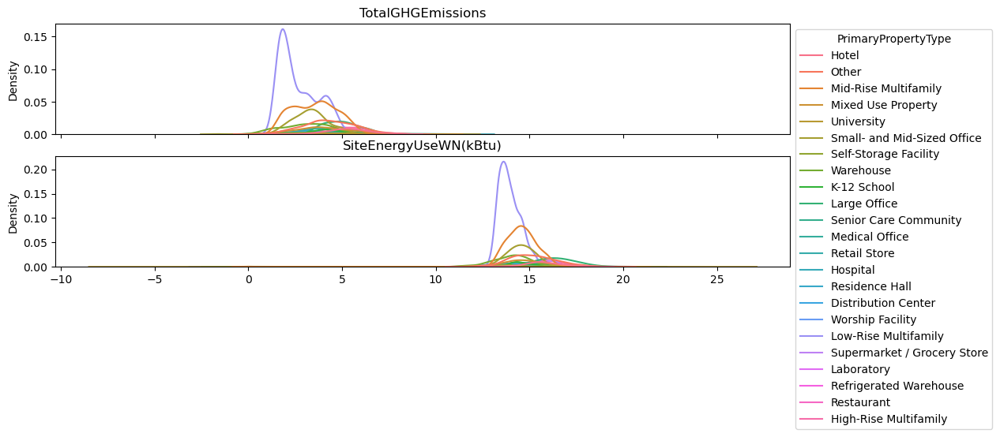

In [107]:
plot_kde('PrimaryPropertyType',log_ = True)

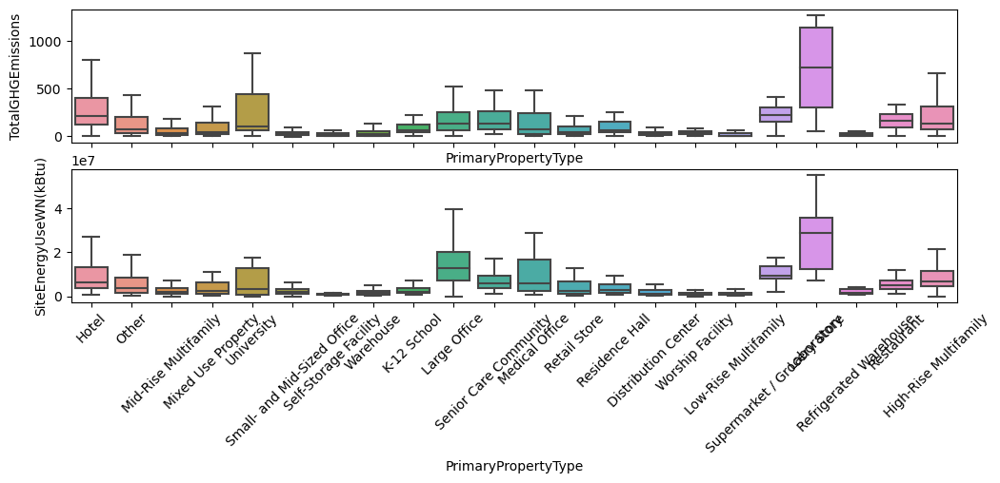

In [108]:
### PrimaryPropertyType sans la modalité "Hospital"
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned.loc[df_cleaned.PrimaryPropertyType != 'Hospital'],x='PrimaryPropertyType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned.loc[df_cleaned.PrimaryPropertyType != 'Hospital'],x='PrimaryPropertyType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=45);

##### LargestPropertyUseType

In [109]:
df_cleaned['LargestPropertyUseType'] = df_cleaned.LargestPropertyUseType.str.lower()

In [110]:
df_cleaned.LargestPropertyUseType.str.lower().value_counts()

multifamily housing                                     1626
office                                                   485
non-refrigerated warehouse                               197
other                                                     98
retail store                                              93
hotel                                                     76
worship facility                                          69
distribution center                                       54
k-12 school                                               50
senior care community                                     45
supermarket/grocery store                                 41
medical office                                            41
parking                                                   32
other - recreation                                        31
self-storage facility                                     28
college/university                                        25
residence hall/dormitory

In [111]:
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'personal services (health/beauty, dry cleaning, etc)','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'movie theater','LargestPropertyUseType'] = 'grouping'

df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'food service','LargestPropertyUseType'] = 'grouping'

df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'police station','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'wholesale club/supercenter','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'residential care facility','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'courthouse','LargestPropertyUseType'] = 'data center'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'fire station','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'pre-school/daycare','LargestPropertyUseType'] = 'grouping'

df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'other - utility','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'adult education','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'other - restaurant/bar','LargestPropertyUseType'] = 'restaurant'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'other - public services','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'lifestyle center','LargestPropertyUseType'] = 'other - mall'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'performing arts','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'library','LargestPropertyUseType'] = 'grouping'
df_cleaned.loc[df_cleaned.LargestPropertyUseType == 'financial office','LargestPropertyUseType'] = 'grouping'

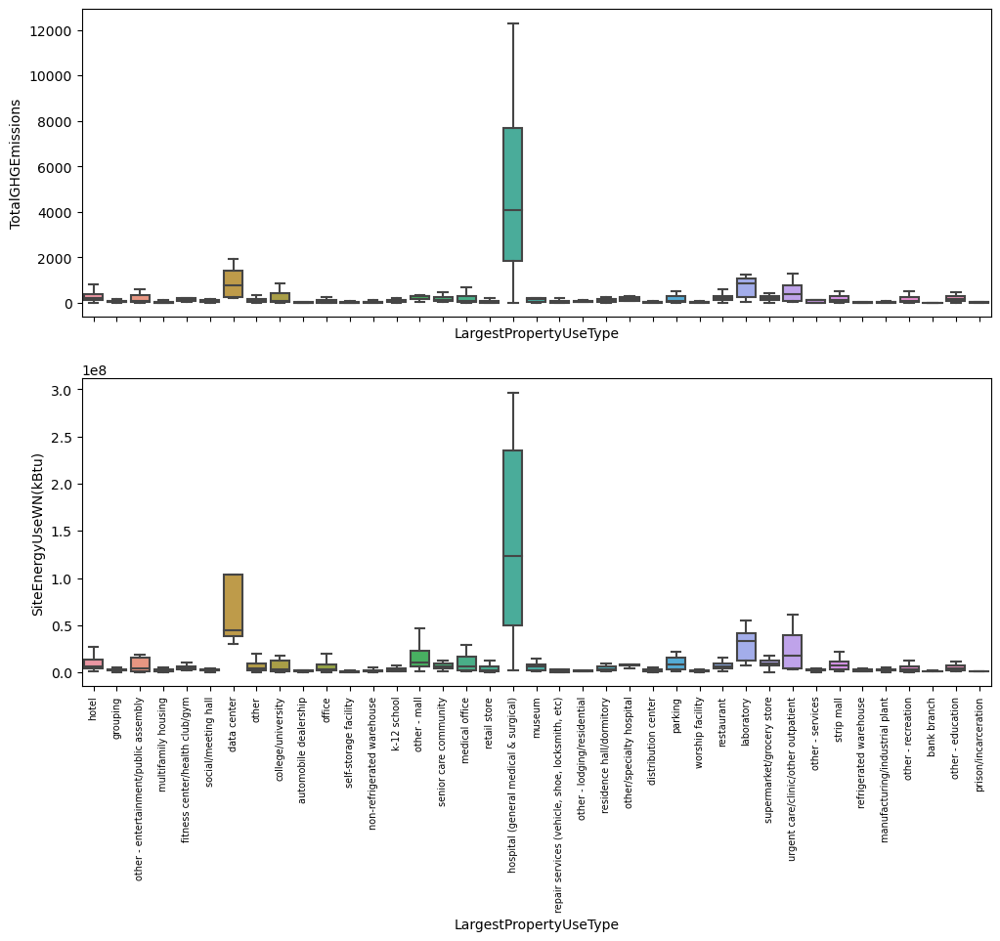

In [112]:
### LargestPropertyUseType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='LargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='LargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

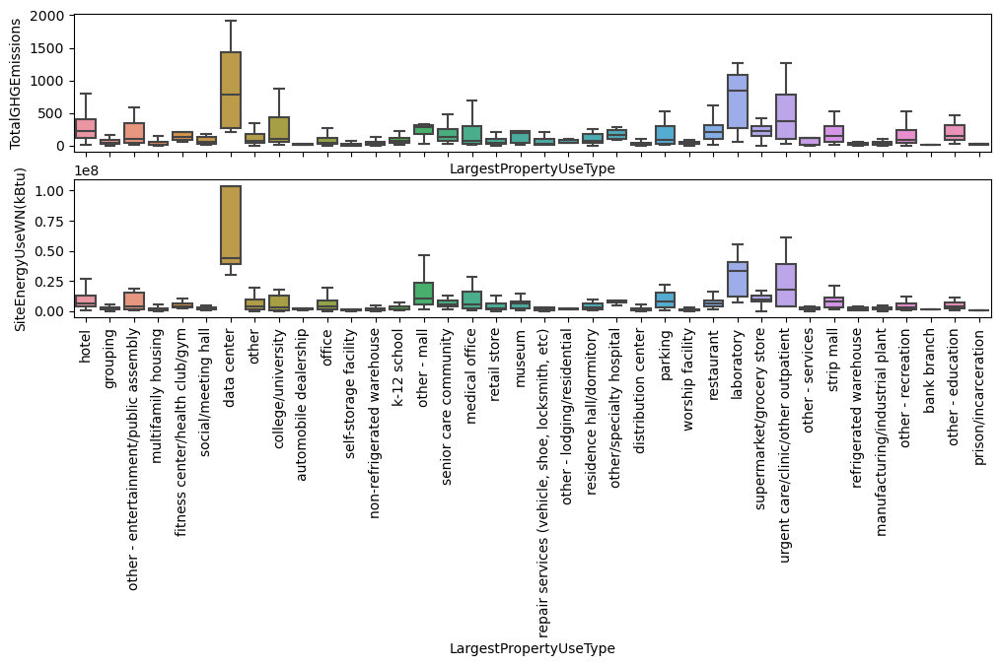

In [113]:
### LargestPropertyUseType
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 4),sharex=True)
sns.boxplot(data=df_cleaned.loc[df_cleaned.LargestPropertyUseType.str.lower() != 'hospital (general medical & surgical)'],x='LargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned.loc[df_cleaned.LargestPropertyUseType.str.lower() != 'hospital (general medical & surgical)'],x='LargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### SecondLargestPropertyUseType   

In [114]:
df_cleaned['SecondLargestPropertyUseType'] = df_cleaned.SecondLargestPropertyUseType.str.lower()

In [115]:
df_cleaned.SecondLargestPropertyUseType.str.lower().value_counts()

void                                                    1557
parking                                                  962
office                                                   215
retail store                                             150
other                                                     56
restaurant                                                40
non-refrigerated warehouse                                31
fitness center/health club/gym                            17
multifamily housing                                       17
data center                                               12
supermarket/grocery store                                 12
other - services                                          12
medical office                                            11
swimming pool                                             10
laboratory                                                 8
other - entertainment/public assembly                      7
distribution center     

In [116]:
mask = df_cleaned.SecondLargestPropertyUseType.value_counts().index[df_cleaned.SecondLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.SecondLargestPropertyUseType.apply(lambda x: x in mask),'SecondLargestPropertyUseType'] = 'grouping'

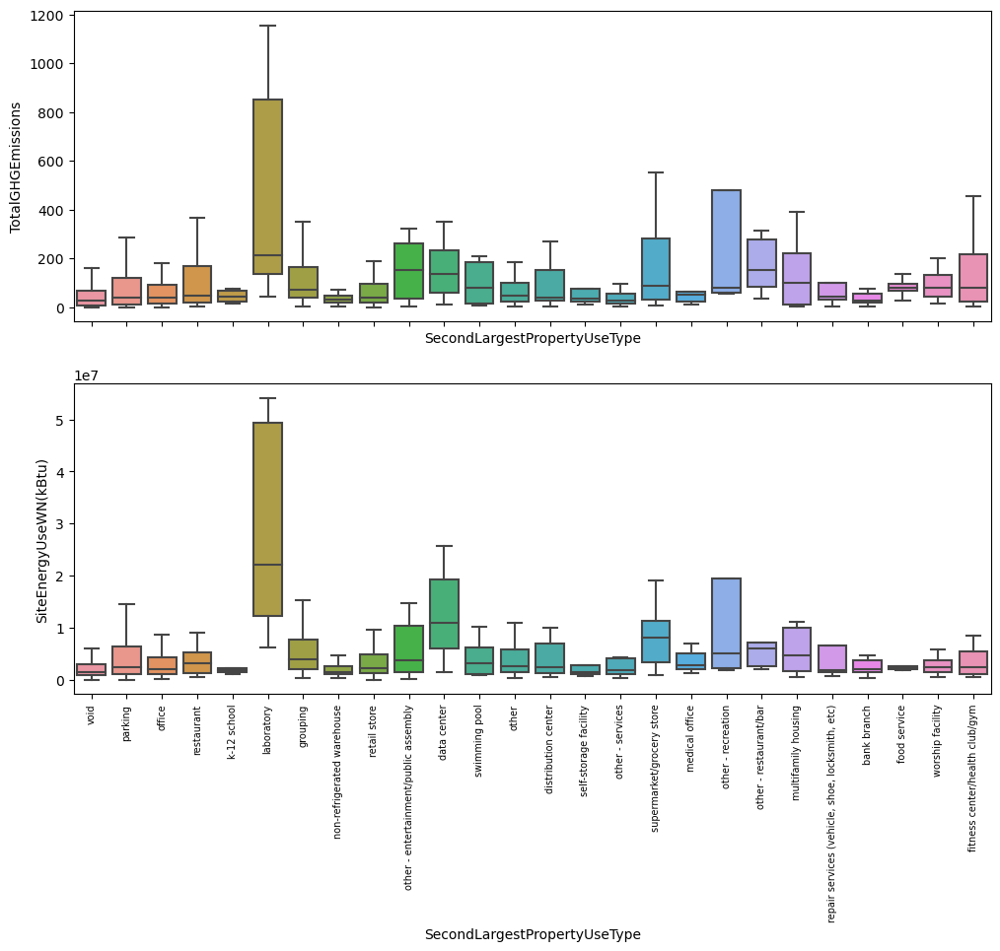

In [117]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='SecondLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='SecondLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### ThirdLargestPropertyUseType

In [118]:
df_cleaned['ThirdLargestPropertyUseType'] = df_cleaned.ThirdLargestPropertyUseType.str.lower()

In [119]:
df_cleaned.ThirdLargestPropertyUseType.value_counts()

void                                                    2619
retail store                                             107
office                                                   105
parking                                                   70
restaurant                                                56
other                                                     49
swimming pool                                             26
non-refrigerated warehouse                                17
medical office                                            17
data center                                               13
multifamily housing                                       12
social/meeting hall                                       11
food service                                              11
other - restaurant/bar                                     9
pre-school/daycare                                         8
bank branch                                                6
fitness center/health cl

In [120]:
mask = df_cleaned.ThirdLargestPropertyUseType.value_counts().index[df_cleaned.ThirdLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.ThirdLargestPropertyUseType.apply(lambda x: x in mask),'ThirdLargestPropertyUseType'] = 'grouping'

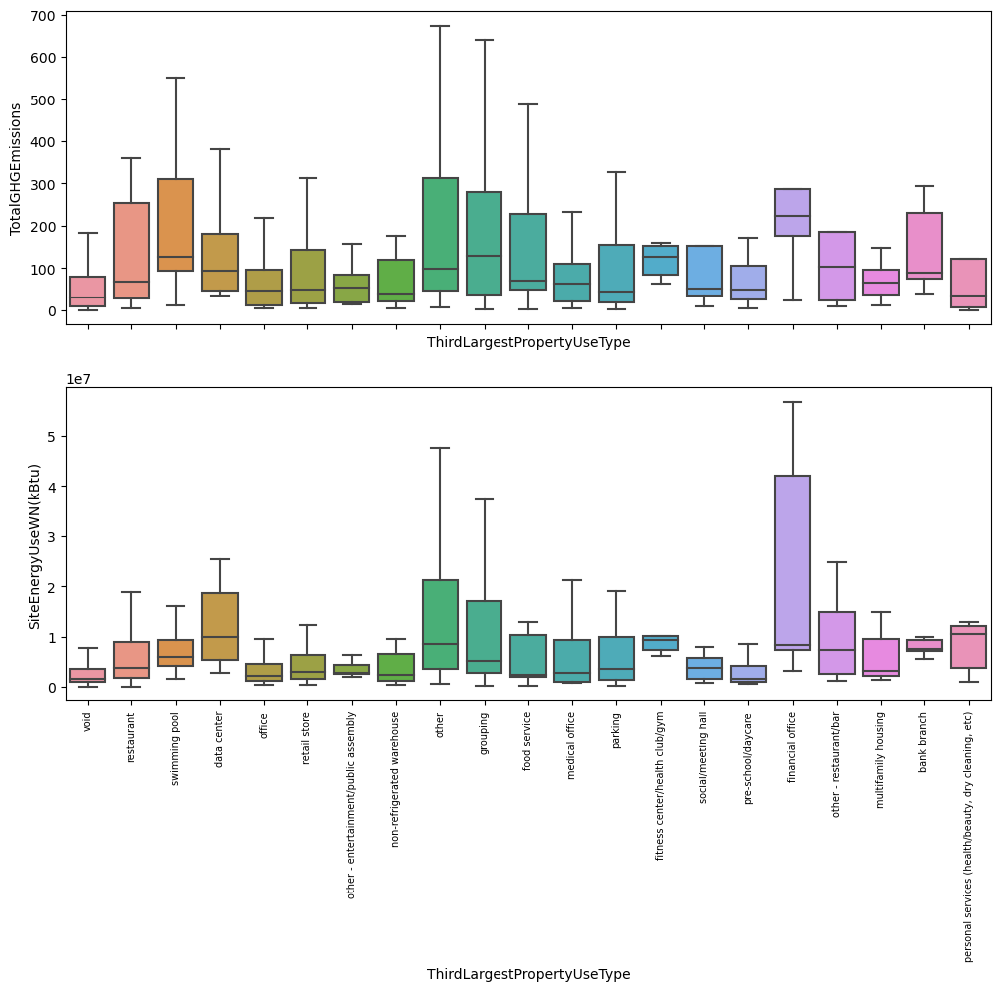

In [121]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='ThirdLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='ThirdLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### FourthLargestPropertyUseType

In [122]:
df_cleaned['FourthLargestPropertyUseType'] = df_cleaned.FourthLargestPropertyUseType.str.lower()

In [123]:
df_cleaned.FourthLargestPropertyUseType.value_counts()

void                                                  2993
retail store                                            51
parking                                                 43
restaurant                                              32
other                                                   17
swimming pool                                            9
other - recreation                                       8
other - entertainment/public assembly                    7
residence hall/dormitory                                 5
office                                                   4
pre-school/daycare                                       4
supermarket/grocery store                                4
other - technology/science                               3
worship facility                                         2
self-storage facility                                    2
multifamily housing                                      2
strip mall                                              

In [124]:
mask = df_cleaned.FourthLargestPropertyUseType.value_counts().index[df_cleaned.FourthLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.FourthLargestPropertyUseType.apply(lambda x: x in mask),'FourthLargestPropertyUseType'] = 'grouping'

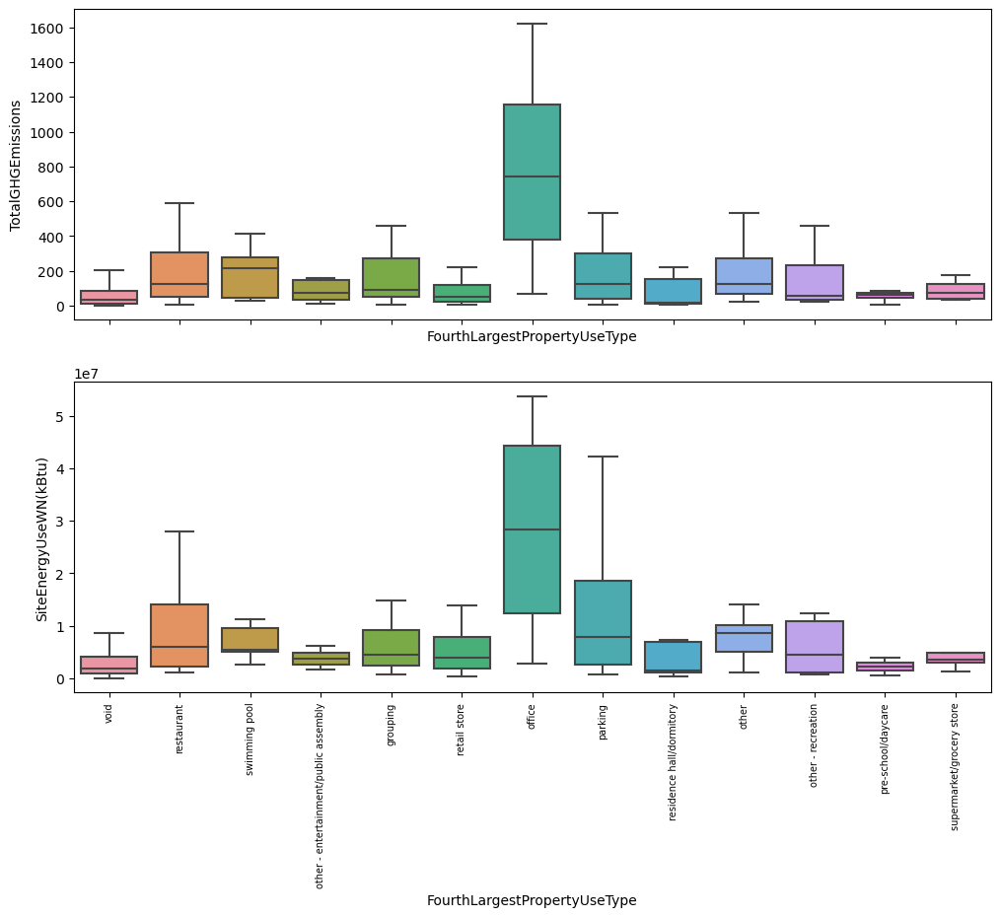

In [125]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='FourthLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='FourthLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### FifthLargestPropertyUseType

In [126]:
df_cleaned['FifthLargestPropertyUseType'] = df_cleaned.FifthLargestPropertyUseType.str.lower()

In [127]:
df_cleaned.FifthLargestPropertyUseType.value_counts()

void                                                  3116
retail store                                            20
parking                                                 18
restaurant                                              17
pre-school/daycare                                       4
other                                                    4
supermarket/grocery store                                4
social/meeting hall                                      4
self-storage facility                                    4
other - restaurant/bar                                   3
office                                                   2
other - technology/science                               1
urgent care/clinic/other outpatient                      1
strip mall                                               1
other - recreation                                       1
other - services                                         1
personal services (health/beauty dry cleaning etc)      

In [128]:
mask = df_cleaned.FifthLargestPropertyUseType.value_counts().index[df_cleaned.FifthLargestPropertyUseType.value_counts()<4].to_list()
df_cleaned.loc[df_cleaned.FifthLargestPropertyUseType.apply(lambda x: x in mask),'FifthLargestPropertyUseType'] = 'grouping'

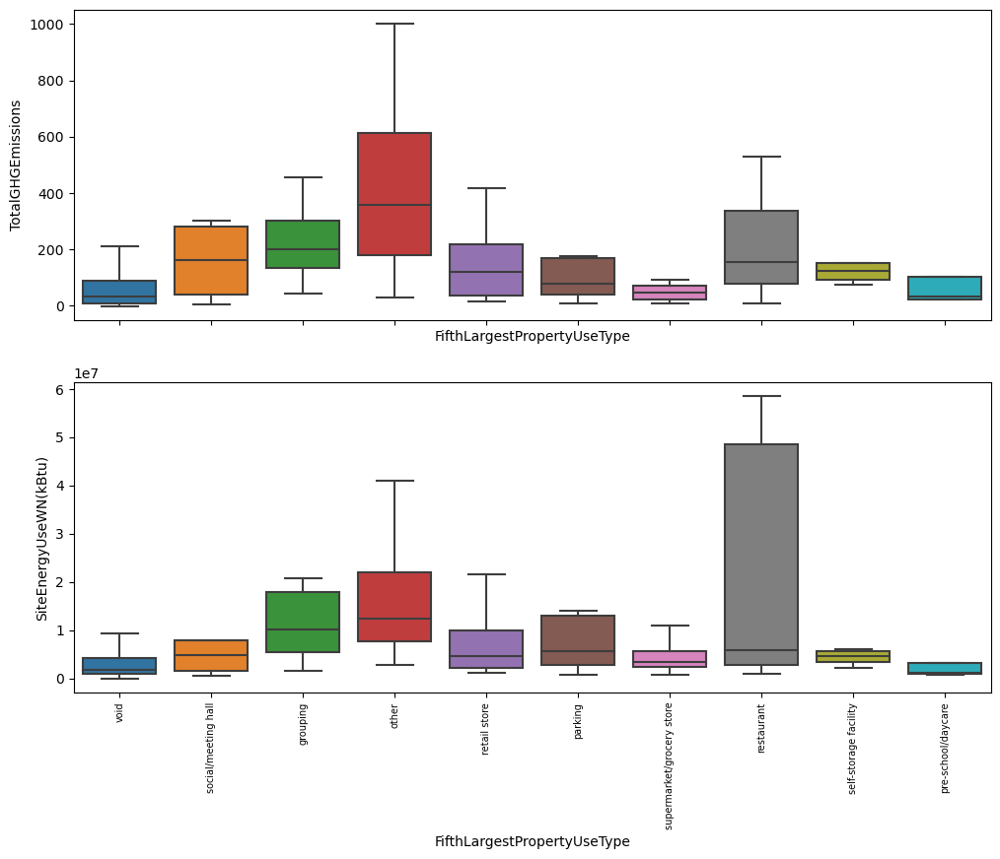

In [129]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='FifthLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='FifthLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### SixthLargestPropertyUseType

In [130]:
df_cleaned['SixthLargestPropertyUseType'] = df_cleaned.SixthLargestPropertyUseType.str.lower()

In [131]:
df_cleaned.SixthLargestPropertyUseType.value_counts()

void                                          3171
restaurant                                       9
retail store                                     8
parking                                          3
pre-school/daycare                               3
social/meeting hall                              3
swimming pool                                    2
senior care community                            1
other                                            1
outpatient rehabilitation/physical therapy       1
other - recreation                               1
worship facility                                 1
supermarket/grocery store                        1
self-storage facility                            1
Name: SixthLargestPropertyUseType, dtype: int64

In [132]:
mask = df_cleaned.SixthLargestPropertyUseType.value_counts().index[df_cleaned.SixthLargestPropertyUseType.value_counts()<3].to_list()
df_cleaned.loc[df_cleaned.SixthLargestPropertyUseType.apply(lambda x: x in mask),'SixthLargestPropertyUseType'] = 'grouping'

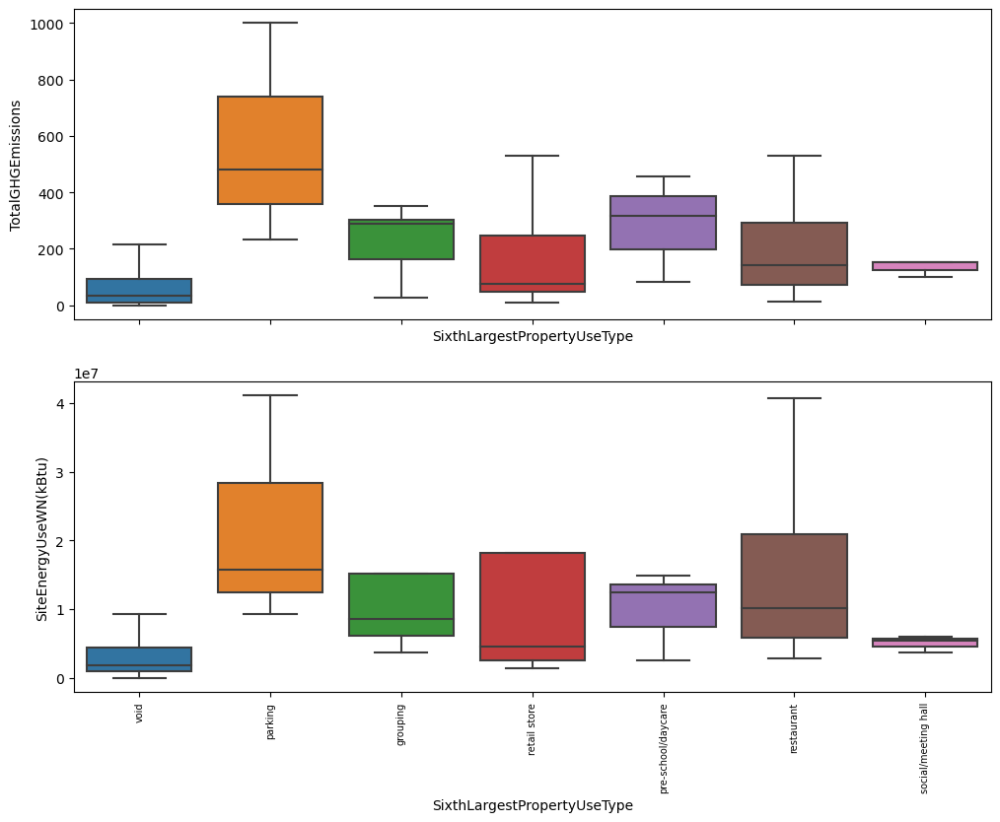

In [133]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='SixthLargestPropertyUseType',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='SixthLargestPropertyUseType',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

##### Zipcode

In [134]:
df_cleaned.ZipCode.value_counts()

98109    291
98104    243
98122    235
98101    223
98134    184
98105    182
98121    181
98102    164
98119    164
98103    152
98125    144
98108    122
98133    118
98115    118
98107    100
98144     91
98116     80
98118     69
98199     68
98112     62
98126     60
98106     45
98117     27
98136     26
98195     10
98146      5
98155      4
98111      3
98114      2
98178      2
98013      2
98177      2
98124      2
98164      2
98154      2
98168      2
98006      1
98165      1
98272      1
98020      1
98204      1
98040      1
98113      1
98198      1
98011      1
98070      1
98127      1
98033      1
98191      1
98028      1
98185      1
98012      1
98181      1
98053      1
98145      1
Name: ZipCode, dtype: int64

In [135]:
mask = df_cleaned.ZipCode.value_counts().index[df_cleaned.ZipCode.value_counts()<10].to_list()
df_cleaned.loc[df_cleaned.ZipCode.apply(lambda x: x in mask),'ZipCode'] = 'grouping'

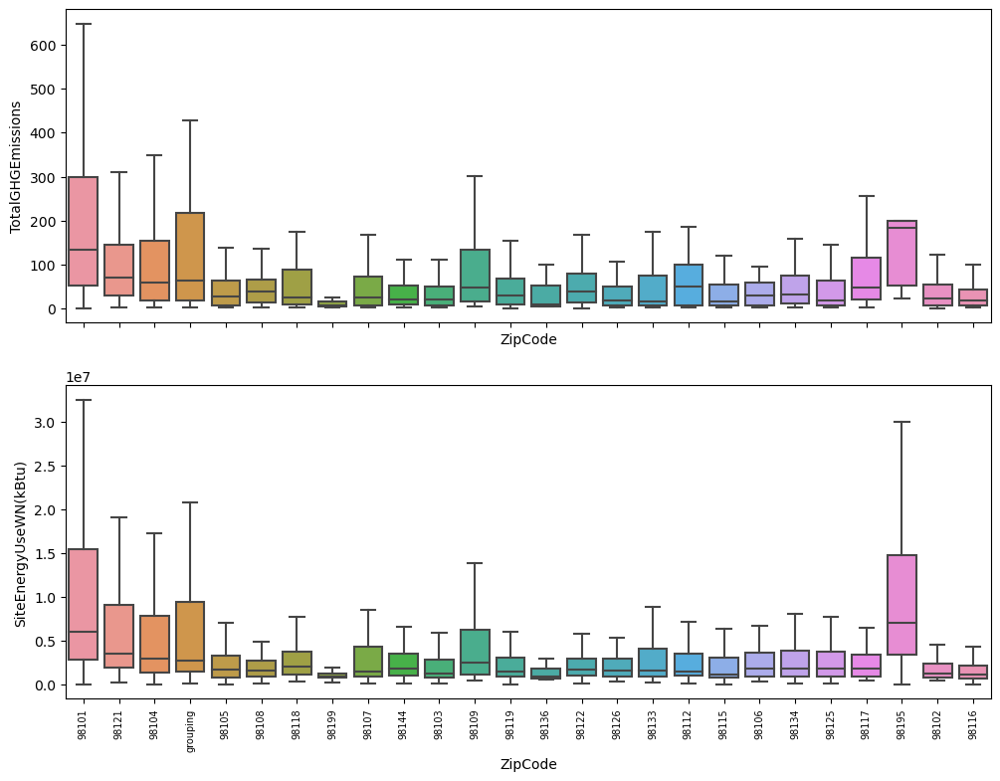

In [136]:
fig, axes = plt.subplots(nrows=2, ncols=1,figsize=(12, 9),sharex=True)
sns.boxplot(data=df_cleaned,x='ZipCode',y='TotalGHGEmissions',showfliers=False,ax=axes[0])

sns.boxplot(data=df_cleaned,x='ZipCode',y='SiteEnergyUseWN(kBtu)',showfliers=False,ax=axes[1])
axes[1].xaxis.set_tick_params(labelsize=7)
axes[1].set_xticklabels( axes[1].get_xticklabels(),rotation=90);

### <a name="C35"><font color='teal'> 3.5 Outliers</font></a> 

In [137]:
from sklearn.base import BaseEstimator
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
class InterQuartileRange(BaseEstimator):
    
    def __init__(self):
        pass
    
    def fit(self, X):
        #On calcule Q1 et Q3
        self.q3 = np.quantile(X,q=0.95)
        self.q1 = np.quantile(X,q=0.05)
        
        # Calcul Ecart interquartile
        self.IQR=self.q3-self.q1
        
        #On calcule la borne inférieure à l'aide du Q1 et de l'écart interquartile
        self.borne_inf = self.q1-1.5 * self.IQR

        #On calcule la borne supérieure à l'aide du Q3 et de l'écart interquartile
        self.borne_sup = self.q3 + 1.5 * self.IQR
        
        # Return the 
        return self

    def predict(self, X):
        
        # Check if fit has been called
        #check_is_fitted(self)

        # Input validation
        #X = check_array(X.values.reshape(-1, 1))
        
        result = np.ones(len(X),dtype=int)
        result[ (X>self.borne_sup).reshape(-1) ]=-1
        result[ (X<self.borne_inf).reshape(-1) ]=-1
        
        return result
    

In [138]:
import time
import numpy as np
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.linear_model import SGDOneClassSVM
from sklearn.kernel_approximation import Nystroem
from sklearn.pipeline import make_pipeline
from scipy.stats import iqr

# Example settings
outliers_fraction = 0.15

# create dataset
from sklearn.preprocessing import OneHotEncoder
# select features
datasets_num = df_cleaned[['Latitude', 'Longitude', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)','LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore','SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions']].copy()

datasets_cat = df_cleaned[['BuildingType', 'PrimaryPropertyType', 'Neighborhood',
'LargestPropertyUseType','SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']].copy()
#.select_dtypes(include=[np.number])

#encoding
enc = OneHotEncoder(handle_unknown='ignore')#,drop='first'
datasets_cat_enc = pd.DataFrame(enc.fit_transform(datasets_cat).toarray(),
                                index=datasets_cat.index.values,
                                columns=enc.get_feature_names_out())

# create dataset
datasets = datasets_num.join(datasets_cat_enc)
del datasets_num,datasets_cat,datasets_cat_enc

# define outlier/anomaly detection methods to be compared.
# the SGDOneClassSVM must be used in a pipeline with a kernel approximation
# to give similar results to the OneClassSVM
anomaly_algorithms = [
    #("Robust covariance", EllipticEnvelope()),#contamination=outliers_fraction)
    ("One-Class SVM", svm.OneClassSVM(kernel="rbf", gamma='auto')),
    (
        "One-Class SVM (SGD)",
        make_pipeline(
            Nystroem(gamma=0.1, random_state=42, n_components=150),
            SGDOneClassSVM(
                shuffle=True,
                fit_intercept=True,
                random_state=42,
                tol=1e-6,
            ),
        ),
    ),
    (
        "Isolation Forest",
        IsolationForest(contamination='auto', random_state=42),
    ),
    (
        "Local Outlier Factor",
        LocalOutlierFactor(n_neighbors=35, contamination='auto'),
    ),
    ('Écart interquartile',InterQuartileRange()),
]


anomalie_col_pred = dict()

for name, algorithm in anomaly_algorithms:  
    anomalie_col_pred[name] = np.zeros( datasets.shape[0] )
        
    for i_dataset, X in enumerate(datasets):        
        algorithm.fit(datasets[[X]].fillna(datasets[[X]].median()).values)

        # fit the data and tag outliers
        if name == "Local Outlier Factor":
            y_pred = algorithm.fit_predict( datasets[[X]].fillna(datasets[[X]].median()).values )
        else:
            y_pred = algorithm.fit( datasets[[X]].fillna(datasets[[X]].median()).values ).predict( datasets[[X]].fillna(datasets[[X]].median()).values )

        # save pred
        anomalie_col_pred[name] = anomalie_col_pred[name] + (y_pred==-1)*1

anomalie_data_pred = dict()        
for name, algorithm in anomaly_algorithms:
        algorithm.fit(datasets.fillna(datasets.median()).values)

        # fit the data and tag outliers
        if name == "Écart interquartile":
            continue
            
        # fit the data and tag outliers
        elif name == "Local Outlier Factor":
            y_pred = algorithm.fit_predict( datasets.fillna(datasets.median()).values )
        else:
            y_pred = algorithm.fit( datasets.fillna(datasets.median()).values ).predict( datasets.fillna(datasets.median()).values )

        # save pred
        anomalie_data_pred[name] = y_pred

In [139]:
pd.DataFrame(anomalie_col_pred).describe()

,One-Class SVM,One-Class SVM (SGD),Isolation Forest,Local Outlier Factor,Écart interquartile
count,3206.000000,3206.000000,3206.000000,3206.000000,3206.000000
mean,137.557704,72.686213,9.476918,0.424205,1.231129
std,1.387803,2.230852,2.799476,0.914621,1.427798
min,133.000000,66.000000,6.000000,0.000000,0.000000
25%,137.000000,71.000000,8.000000,0.000000,0.000000
50%,138.000000,73.000000,9.000000,0.000000,1.000000
75%,138.000000,74.000000,11.000000,1.000000,2.000000
max,142.000000,80.000000,20.000000,9.000000,11.000000


In [140]:
pd.concat([(pd.DataFrame(anomalie_data_pred)==1).sum(), 
           ((pd.DataFrame(anomalie_data_pred)==1).sum()/pd.DataFrame(anomalie_data_pred).shape[0])], axis=1)\
.rename(columns={0:'Nombre de Inliers',1:"Proportion d'inliers"})

,Nombre de Inliers,Proportion d'inliers
One-Class SVM,0,0.000000
One-Class SVM (SGD),150,0.046787
Isolation Forest,3197,0.997193
Local Outlier Factor,3104,0.968185


Isolation Forest et Local Outlier Factor, nous fournissent les résultats les plus conformes, nous choissisont donc 
Local Outlier Factor

In [141]:
pd.DataFrame(anomalie_data_pred).describe()

,One-Class SVM,One-Class SVM (SGD),Isolation Forest,Local Outlier Factor
count,3206.0,3206.000000,3206.000000,3206.000000
mean,-1.0,-0.906425,0.994386,0.936369
std,0.0,0.422432,0.105834,0.351071
min,-1.0,-1.000000,-1.000000,-1.000000
25%,-1.0,-1.000000,1.000000,1.000000
50%,-1.0,-1.000000,1.000000,1.000000
75%,-1.0,-1.000000,1.000000,1.000000
max,-1.0,1.000000,1.000000,1.000000


<div class="alert alert-info">Le Local outlier Factor semble plus stable</div>

In [142]:
df_cleaned.shape

(3206, 29)

In [143]:
df_cleaned = df_cleaned.loc[anomalie_data_pred['Local Outlier Factor']==1]
del datasets
df_cleaned.shape

(3104, 29)

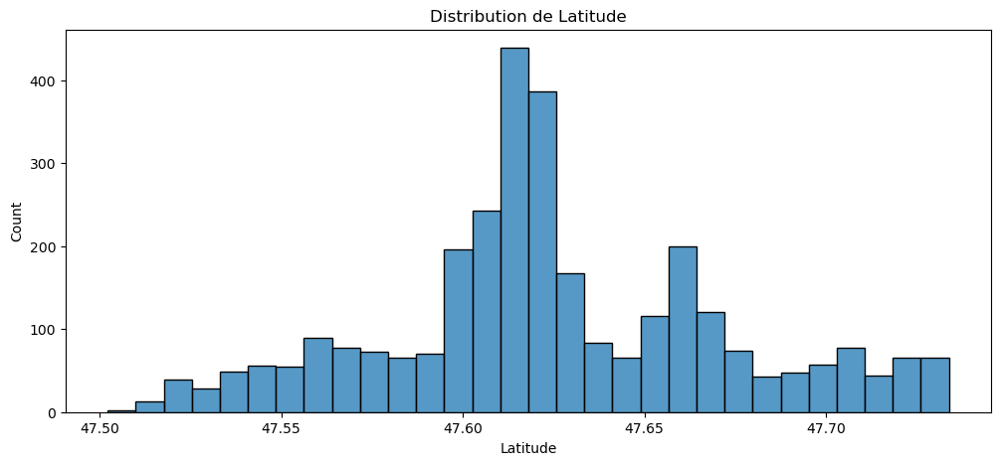

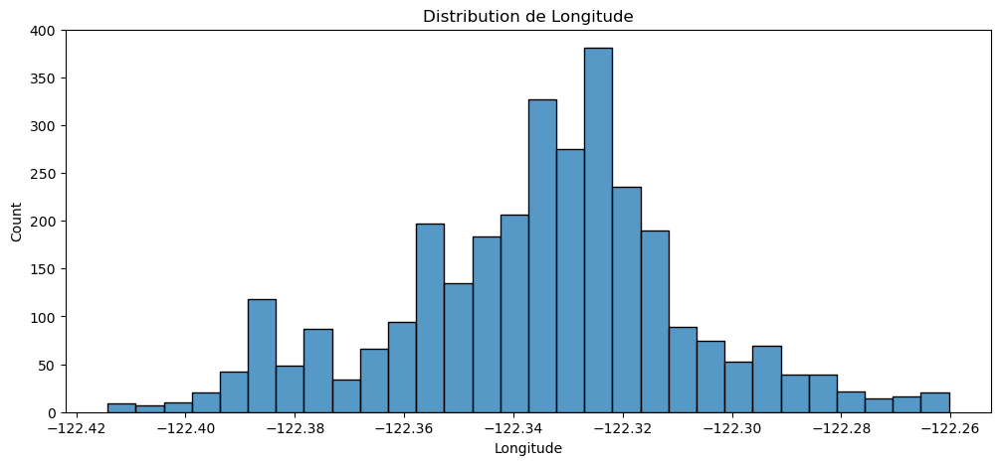

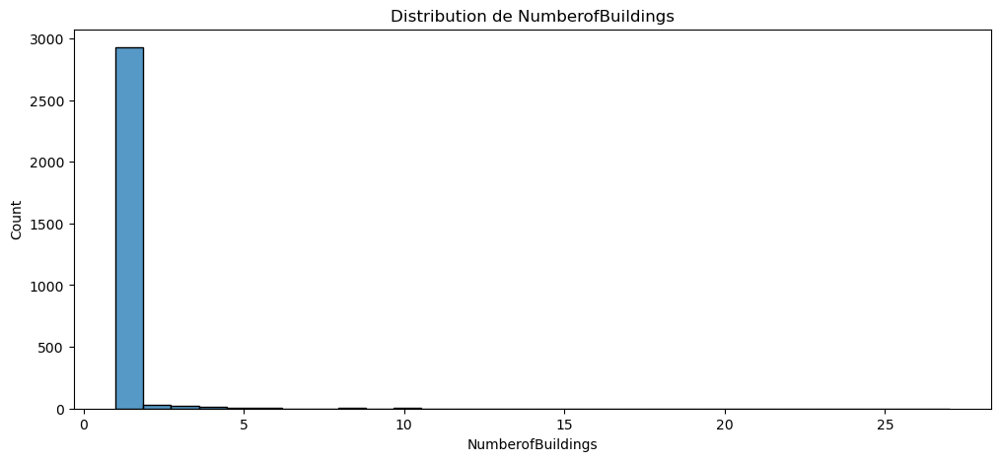

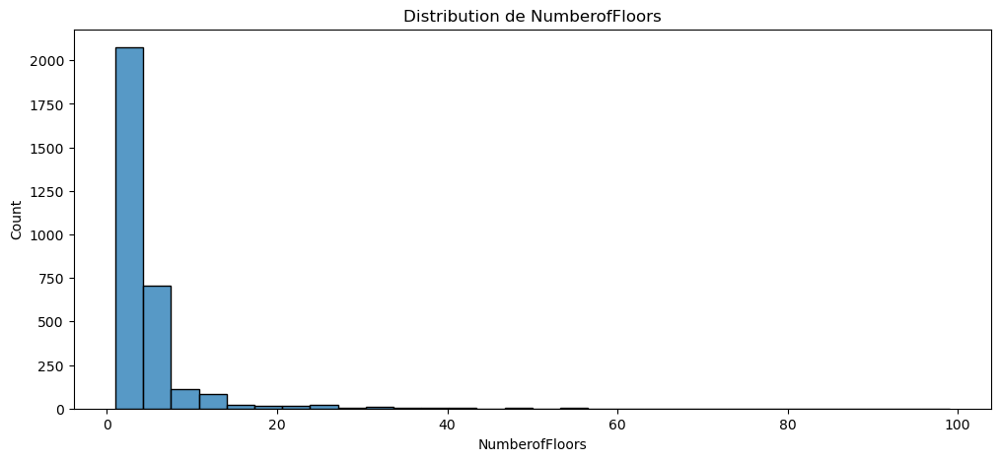

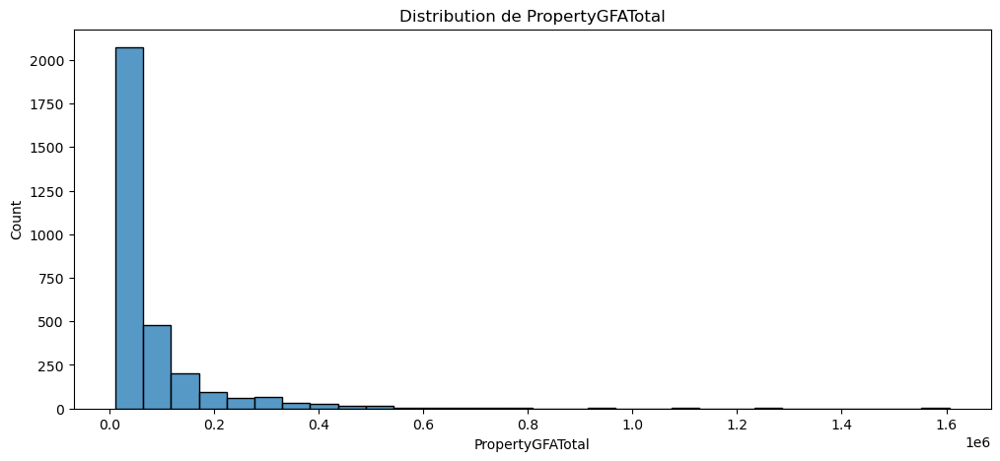

...

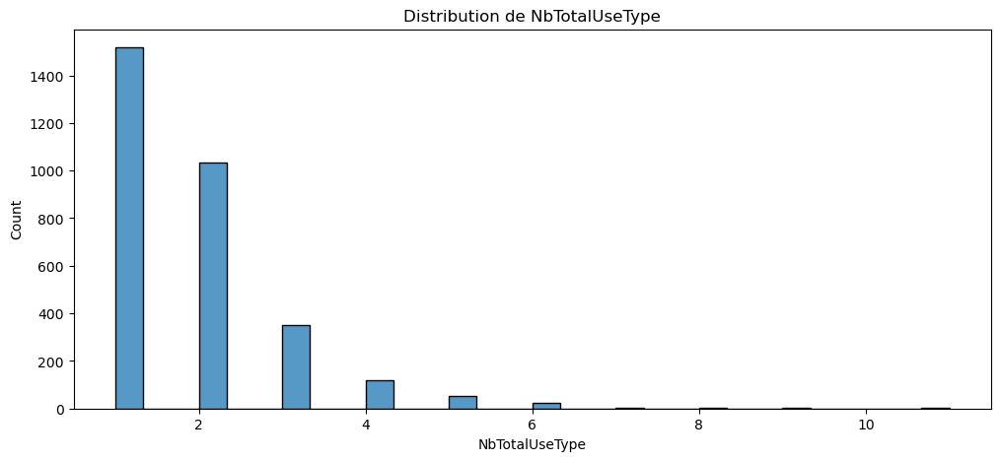

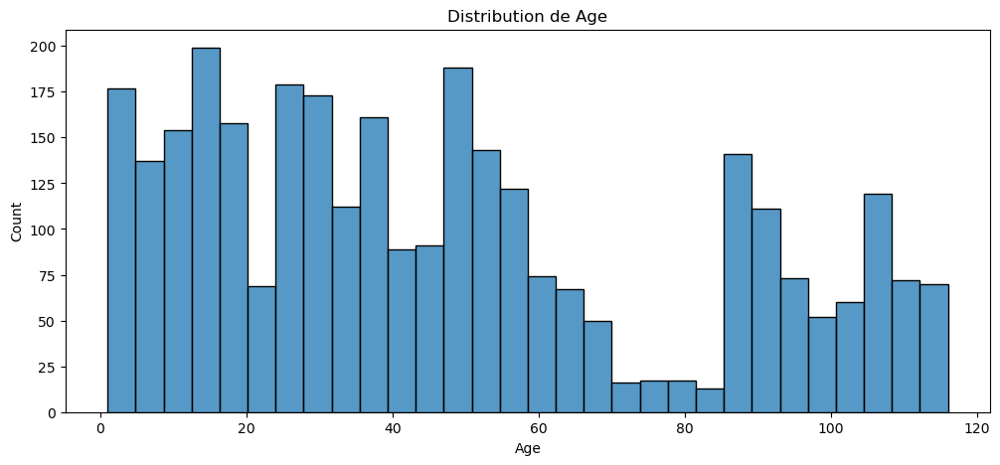

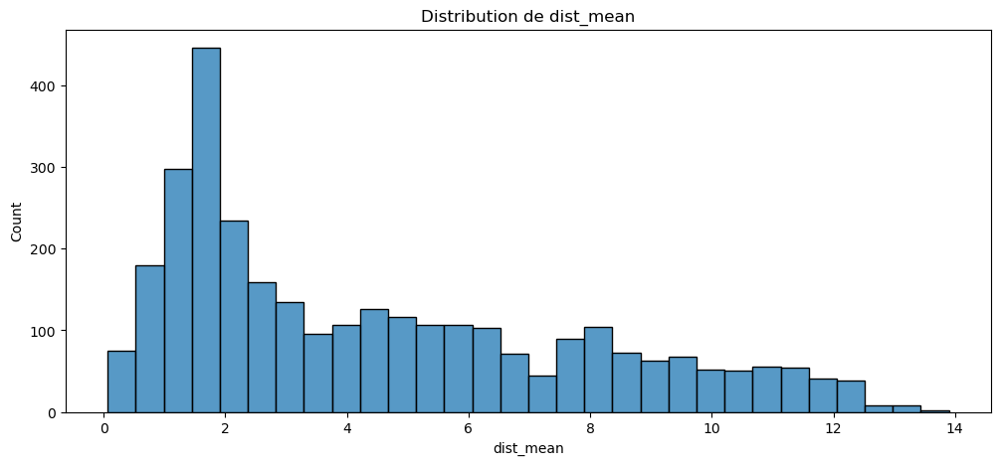

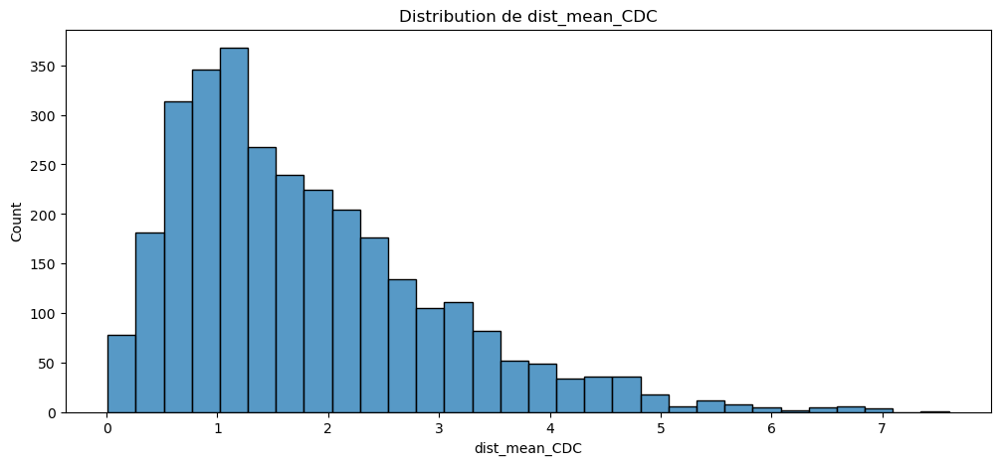

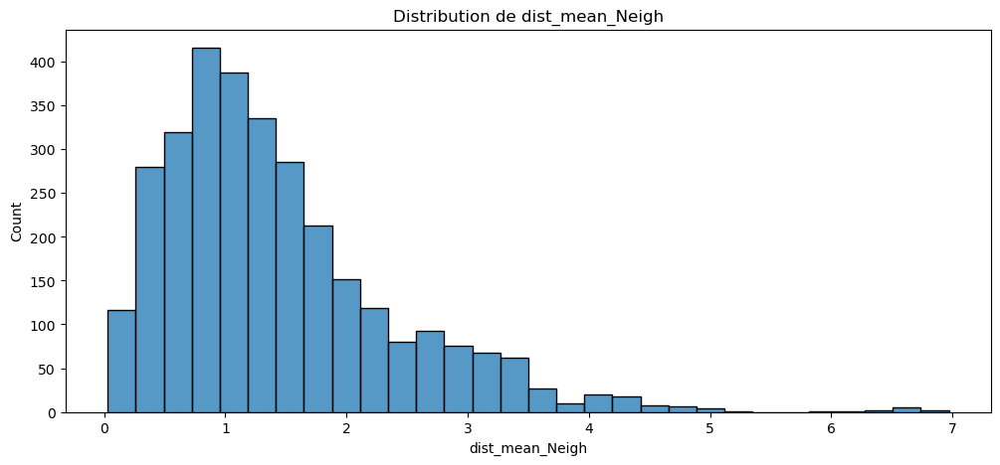

In [144]:
warnings.filterwarnings(action='ignore')
for column in df_cleaned.select_dtypes(np.number).columns:
    plt.figure(figsize=(12,5))
    plt.title('Distribution de ' + column)
    sns.histplot( df_cleaned[column].dropna() , bins=30)
    #sns.boxplot(df_cleaned[column].dropna())

### <a name="C36"><font color='teal'> 3.6 Normalité</font></a>

In [145]:
df_cleaned.select_dtypes(include=[np.number]).columns

Index(['Latitude', 'Longitude', 'NumberofBuildings', 'NumberofFloors',
       'PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions', 'NbTotalUseType', 'Age',
       'dist_mean', 'dist_mean_CDC', 'dist_mean_Neigh'],
      dtype='object')

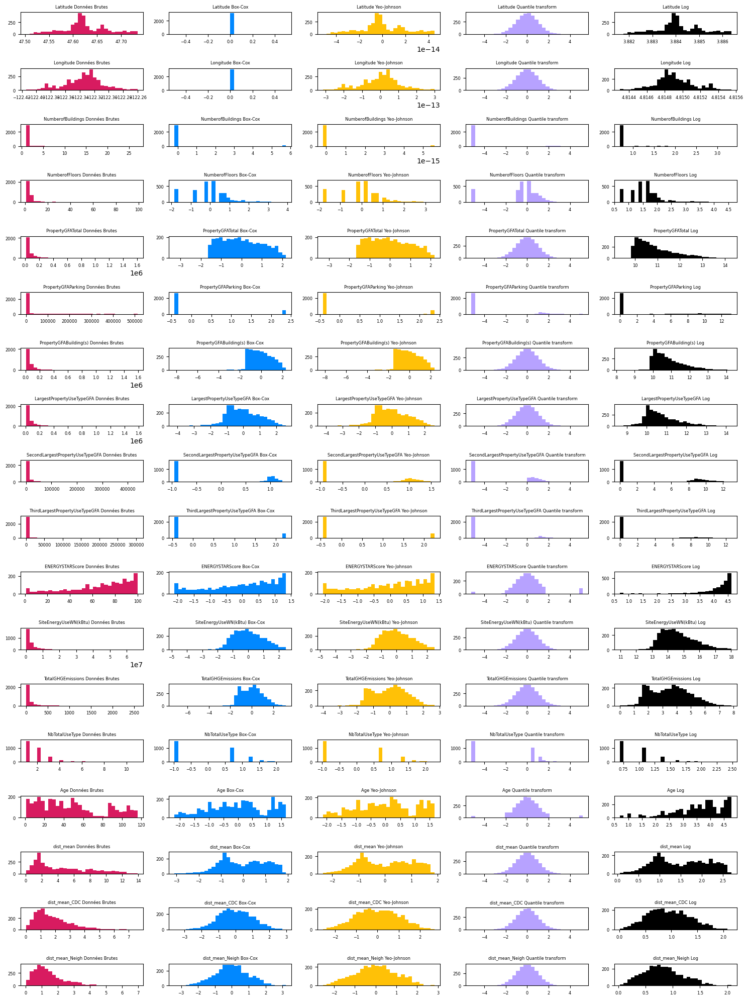

In [146]:
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import QuantileTransformer

#Box-Cox exige que les données d'entrée soient strictement positives, ce qui n'est pas notre cas
bc = PowerTransformer(method="box-cox")

#tandis que Yeo-Johnson prend en charge les données positives ou négatives.
yj = PowerTransformer(method="yeo-johnson")
# n_quantiles is set to the training set size rather than the default value
# to avoid a warning being raised by this example
qt = QuantileTransformer(output_distribution="normal")


#ize = (N_SAMPLES, 1)
FONT_SIZE = 6

# Couleurs
colors = ["#D81B60", "#0188FF", "#FFC107", "#B7A2FF","#000000"]
meth_name = ("Données Brutes","Box-Cox", "Yeo-Johnson", "Quantile transform",'Log')
fig, axes = plt.subplots(nrows=18, ncols=5, figsize=(15,20))
#xes = axes.flatten()


for j,col in enumerate(df_cleaned.select_dtypes(include=[np.number]).columns):
    # perform power transforms and quantile transform
    X_trans_bc = bc.fit_transform( abs(df_cleaned[col]+0.00001).dropna().values.reshape(-1,1) )
    X_trans_yj = yj.fit_transform( df_cleaned[col].dropna().values.reshape(-1,1) )
    X_trans_qt = qt.fit_transform( df_cleaned[col].dropna().values.reshape(-1,1) )
    X_trans_log = np.log1p( abs(df_cleaned[col].dropna()).values.reshape(-1,1) )
    
    
    for i,X in enumerate([df_cleaned[col].dropna().values.reshape(-1,1),X_trans_bc,X_trans_yj,X_trans_qt,X_trans_log]):
        axes[j,i].hist(X, color=colors[i], bins=30)
        title = col+" {}".format(meth_name[i])
        axes[j,i].set_title(title, fontsize=FONT_SIZE)
        axes[j,i].tick_params(axis="both", which="major", labelsize=FONT_SIZE)
        


plt.tight_layout()
plt.show()

In [147]:
from scipy import stats
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer

# Initialisation
numCol = df_cleaned.select_dtypes(include = [np.number]).columns
data_temp = df_cleaned.copy()

QTn = QuantileTransformer(output_distribution="normal")
PTrYJ = PowerTransformer(method="yeo-johnson")
PTrBC = PowerTransformer(method="box-cox")

df_normalite = pd.DataFrame()
list_col = []
list_Shapiro = []
list_Shapiro_PowerTransformer_Yeo_Johnson = []
list_Shapiro_PowerTransformer_Box_Cox = []
list_Shapiro_QuantileTransformer = []

list_kstest = []
list_kstest_PowerTransformer_Yeo_Johnson = []
list_kstest_PowerTransformer_Box_Cox = []
list_kstest_QuantileTransformer = []

#list_skewness = []

for i,col in enumerate([x for x in numCol]):
    list_col.append(col)
    #print(col)
    list_Shapiro.append(stats.shapiro(data_temp[col].dropna())[1])
    list_Shapiro_PowerTransformer_Yeo_Johnson.append(stats.shapiro( PTrYJ.fit_transform(data_temp[col].dropna().values.reshape(-1,1)))[1])
    list_Shapiro_QuantileTransformer.append( stats.shapiro( QTn.fit_transform(data_temp[col].dropna().values.reshape(-1,1))  )[1])
    
    list_kstest.append(stats.kstest(data_temp[col].dropna(), 'norm')[1])
    list_kstest_PowerTransformer_Yeo_Johnson.append(stats.kstest( PTrYJ.fit_transform(data_temp[col].dropna().values.reshape(-1,1)), 'norm')[1])
    list_kstest_QuantileTransformer.append(stats.kstest(QTn.fit_transform(data_temp[col].dropna().values.reshape(-1,1)), 'norm')[1])
    
    try :
        list_Shapiro_PowerTransformer_Box_Cox.append(stats.shapiro( PTrBC.fit_transform(data_temp[col].dropna().values.reshape(-1,1)))[1])
        list_kstest_PowerTransformer_Box_Cox.append(stats.kstest( PTrBC.fit_transform(data_temp[col].dropna().values.reshape(-1,1)), 'norm')[1])

    except :
        list_Shapiro_PowerTransformer_Box_Cox.append(stats.shapiro( PTrBC.fit_transform(abs(data_temp[col]+0.0001).dropna().values.reshape(-1,1)))[1])
        list_kstest_PowerTransformer_Box_Cox.append(stats.kstest( PTrBC.fit_transform(abs(data_temp[col]+0.0001).dropna().values.reshape(-1,1)), 'norm')[1])
    
    
    #list_skewness.append(stats.skew(data_temp[col].dropna()) )
    
df_normalite['Colonne'] = list_col
df_normalite['pvalue_Shapiro'] = list_Shapiro
df_normalite['pvalue_Shapiro_PowerTransformer_Yeo_Johnson'] = list_Shapiro_PowerTransformer_Yeo_Johnson                                                 
df_normalite['pvalue_Shapiro_PowerTransformer_Box_Cox'] = list_Shapiro_PowerTransformer_Box_Cox                                                 
df_normalite['pvalue_Shapiro_QuantileTransformer'] = list_Shapiro_QuantileTransformer                                                 
                                                 
df_normalite['pvalue_Kolmogorov-Smirnov'] = list_kstest
df_normalite['pvalue_Kolmogorov-Smirnov_PowerTransformer_Yeo_Johnson'] = list_kstest_PowerTransformer_Yeo_Johnson                                                 
df_normalite['pvalue_Kolmogorov-Smirnov_PowerTransformer_Box_Cox'] = list_kstest_PowerTransformer_Box_Cox                                                 
df_normalite['pvalue_Kolmogorov-Smirnov_QuantileTransformer'] = list_kstest_QuantileTransformer                                                 
                                                 
#df_normalite['skewness_empirique'] = list_skewness

del list_kstest,list_col,list_Shapiro,data_temp,QTn,PTrBC,PTrYJ
del list_Shapiro_PowerTransformer_Yeo_Johnson,list_Shapiro_PowerTransformer_Box_Cox
del list_Shapiro_QuantileTransformer,list_kstest_PowerTransformer_Yeo_Johnson,
del list_kstest_PowerTransformer_Box_Cox, list_kstest_QuantileTransformer 
#del list_skewness

df_normalite

,Colonne,pvalue_Shapiro,pvalue_Shapiro_PowerTransformer_Yeo_Johnson,pvalue_Shapiro_PowerTransformer_Box_Cox,pvalue_Shapiro_QuantileTransformer,pvalue_Kolmogorov-Smirnov,pvalue_Kolmogorov-Smirnov_PowerTransformer_Yeo_Johnson,pvalue_Kolmogorov-Smirnov_PowerTransformer_Box_Cox,pvalue_Kolmogorov-Smirnov_QuantileTransformer
0,Latitude,4.510397e-22,6.885419e-22,1.000000e+00,1.347077e-02,0.0,0.0,0.0,0.0
1,Longitude,1.490289e-18,2.026316e-18,1.000000e+00,7.988621e-03,0.0,0.0,0.0,0.0
2,NumberofBuildings,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0
3,NumberofFloors,0.000000e+00,6.891403e-32,1.234994e-33,0.000000e+00,0.0,0.0,0.0,0.0
4,PropertyGFATotal,0.000000e+00,9.340663e-26,9.358394e-26,1.034118e-02,0.0,0.0,0.0,0.0
5,PropertyGFAParking,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0
6,PropertyGFABuilding(s),0.000000e+00,1.281908e-26,1.279410e-26,1.320394e-02,0.0,0.0,0.0,0.0
7,LargestPropertyUseTypeGFA,0.000000e+00,8.786419e-17,8.818684e-17,1.413827e-02,0.0,0.0,0.0,0.0
8,SecondLargestPropertyUseTypeGFA,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0
9,ThirdLargestPropertyUseTypeGFA,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0


In [148]:
np.c_[PTYJ.fit_transform(df_cleaned['TotalGHGEmissions'].dropna().values.reshape(-1,1)),
                   PTYJ.fit_transform(df_cleaned['SiteEnergyUseWN(kBtu)'].dropna().values.reshape(-1,1))]

NameError: name 'PTYJ' is not defined

In [153]:
xx = np.random.normal(loc=0.0, scale=10.0, size=100)
yy = xx**2

np.corrcoef(xx,yy)

array([[1.        , 0.20201817],
       [0.20201817, 1.        ]])

In [155]:
stats.pearsonr(xx, yy) 

(0.20201816553410037, 0.043840175597581674)

In [156]:
stats.kendalltau(xx, yy)

KendalltauResult(correlation=0.08565656565656568, pvalue=0.20668927810155424)

In [157]:
stats.spearmanr(xx, yy)

SpearmanrResult(correlation=0.09293729372937293, pvalue=0.3577395336161041)

<AxesSubplot:>

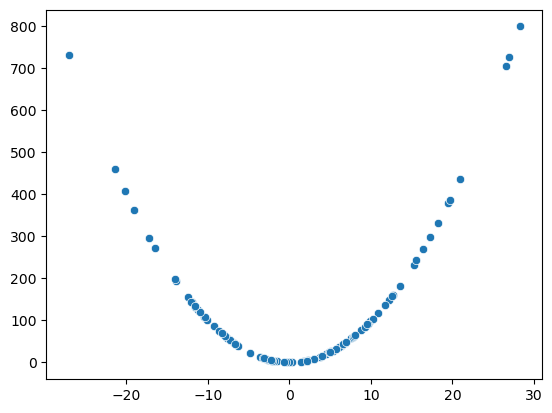

In [154]:
sns.scatterplot(x=xx,y=yy)

In [158]:
df_cleaned.columns

Index(['BuildingType', 'PrimaryPropertyType', 'ZipCode', 'CouncilDistrictCode',
       'Neighborhood', 'Latitude', 'Longitude', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore',
       'SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions', 'NbTotalUseType',
       'FourthLargestPropertyUseType', 'FifthLargestPropertyUseType',
       'SixthLargestPropertyUseType', 'Age', 'dist_mean', 'dist_mean_CDC',
       'dist_mean_Neigh'],
      dtype='object')

In [159]:
len(df_cleaned.columns)

29

### AutoFeat with 0 feateng_steps
[AutoFeat] The 0 step feature engineering process could generate up to 16 features.
[AutoFeat] With 2256 data points this new feature matrix would use about 0.00 gb of space.
[feateng] Warning: no features generated for max_steps < 1.
[featsel] Scaling data...done.
[featsel] Feature selection run 1/5
[featsel] Feature selection run 2/5
[featsel] Feature selection run 3/5
[featsel] Feature selection run 4/5
[featsel] Feature selection run 5/5
[featsel] 8 features after 5 feature selection runs
[featsel] 6 features after correlation filtering
[featsel] 5 features after noise filtering
[AutoFeat] Final dataframe with 16 feature columns (0 new).
[AutoFeat] Training final regression model.
[AutoFeat] Trained model: largest coefficients:
2543558.2296102904
393944.194725 * NbTotalUseType
-167662.804406 * dist_mean_Neigh
-45641.652996 * ENERGYSTARScore
12366.232721 * Age
41.727252 * PropertyGFATotal
[AutoFeat] Final score: 0.7145
## Final R^2: 0.7145




### A

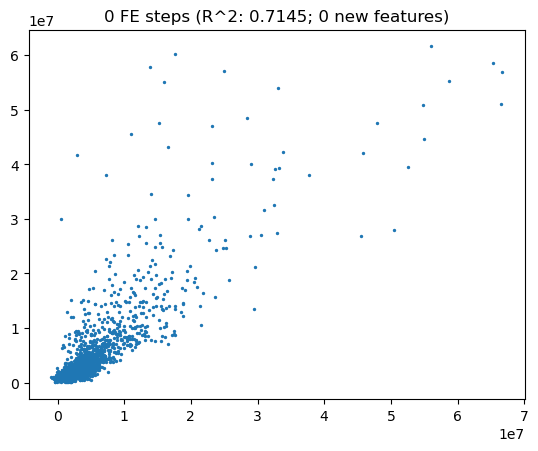

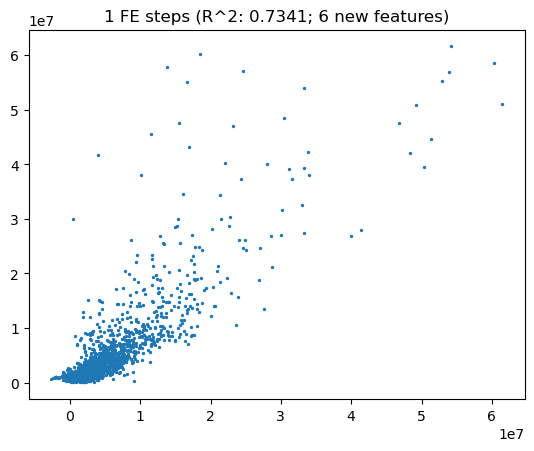

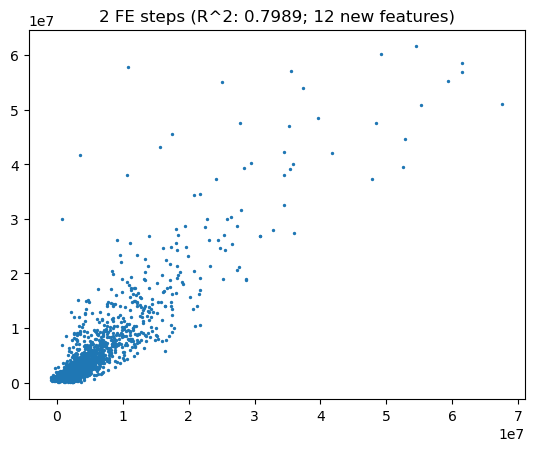

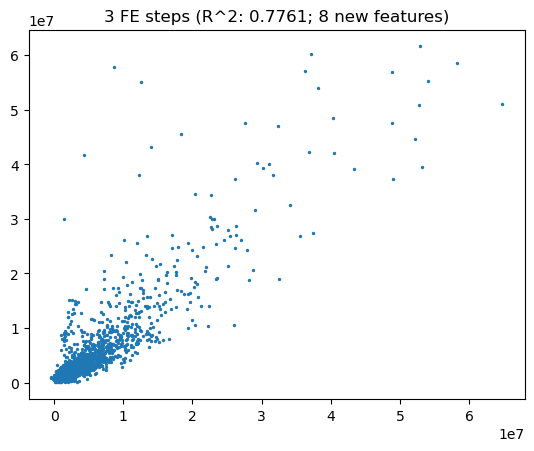

In [164]:
from autofeat import FeatureSelector, AutoFeatRegressor

df_org = df_cleaned.copy().select_dtypes(include=[np.number]).dropna().drop(columns=['SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions'])
target = df_cleaned.copy().select_dtypes(include=[np.number]).dropna()['SiteEnergyUseWN(kBtu)']

#df_org = df_cleaned.copy().dropna().drop(columns=['SiteEnergyUseWN(kBtu)', 'TotalGHGEmissions'])
#target = df_cleaned.copy().dropna()['SiteEnergyUseWN(kBtu)']


for steps in range(4):
    np.random.seed(55)
    print("### AutoFeat with %i feateng_steps" % steps)
    afreg = AutoFeatRegressor(verbose=1, feateng_steps=steps)
    df = afreg.fit_transform(df_org, target)
    r2 = afreg.score(df_org, target)
    print("## Final R^2: %.4f" % r2)
    plt.figure()
    plt.scatter(afreg.predict(df_org), target, s=2);
    plt.title("%i FE steps (R^2: %.4f; %i new features)" % (steps, r2, len(afreg.new_feat_cols_)))
    print("\n\n\n")

### <a name="C37"><font color='teal'> 3.7 Variable à prédire</font></a>

In [ ]:
warnings.filterwarnings(action='ignore')
fig = plt.figure(figsize=(12, 9))

from sklearn.preprocessing import quantile_transform

for idx,tr in enumerate(['raw','log','Yeo-Johnson','quantile_transform']):
    if tr == 'raw':
        ax = fig.add_subplot(4,1, (idx+1))
        #h = ax.hist(df_cleaned[feat], bins=50, color='steelblue', density=True, edgecolor='none')
        sns.scatterplot(x=df_cleaned['TotalGHGEmissions'],y=df_cleaned['SiteEnergyUseWN(kBtu)'],ax=ax)\
        .set(title="Répartition des émissions de CO2{} vs consommation d'énergie{}".format(tr,tr))

        ax.xaxis.set_tick_params(labelsize=7)
        ax.set(xlabel='')

    if tr == 'log':
        ax = fig.add_subplot(4,1, (idx+1))
        sns.scatterplot(x=np.log1p(df_cleaned['TotalGHGEmissions']),y=np.log1p(df_cleaned['SiteEnergyUseWN(kBtu)']),ax=ax)\
        .set(title="Répartition des émissions de CO2{} vs consommation d'énergie{}".format(tr,tr))
        ax.xaxis.set_tick_params(labelsize=7)
        ax.set(xlabel='')
        
        
    if tr == 'Yeo-Johnson':
        ax = fig.add_subplot(4,1, (idx+1))
        
        PTYJ = PowerTransformer(method="yeo-johnson")
        
        xxx = np.c_[PTYJ.fit_transform(df_cleaned['TotalGHGEmissions'].dropna().values.reshape(-1,1)),
                   PTYJ.fit_transform(df_cleaned['SiteEnergyUseWN(kBtu)'].dropna().values.reshape(-1,1))]
        
        sns.scatterplot(data=xxx,x=xxx[:,0],y=xxx[:,1],ax=ax)\
        .set(title="Répartition des émissions de CO2{} vs consommation d'énergie{}".format(tr,tr))
        ax.xaxis.set_tick_params(labelsize=7)
        ax.set(xlabel='')
        
    if tr == 'quantile_transform':
        ax = fig.add_subplot(4,1, (idx+1))
        
        
        xx = pd.DataFrame(np.c_[quantile_transform(df_cleaned['TotalGHGEmissions'].values.reshape(-1, 1), output_distribution="normal", copy=True),
                            quantile_transform(df_cleaned['SiteEnergyUseWN(kBtu)'].values.reshape(-1, 1), output_distribution="normal", copy=True)],
                         columns=['TotalGHGEmissions','SiteEnergyUseWN(kBtu)'])
        
        sns.scatterplot(data = xx, x='TotalGHGEmissions',y='SiteEnergyUseWN(kBtu)', ax=ax)\
        .set(title="Répartition des émissions de CO2{} vs consommation d'énergie{}".format(tr,tr))
        ax.xaxis.set_tick_params(labelsize=7)

###### Etude distribution 

In [ ]:
warnings.filterwarnings(action='ignore')
fig = plt.figure(figsize=(12, 9))

from sklearn.preprocessing import quantile_transform

for idx,feat in enumerate(['TotalGHGEmissions','SiteEnergyUseWN(kBtu)']):
    for i,tr in enumerate(['raw','log','quantile_transform']):
        if tr == 'raw':
            ax = fig.add_subplot(3,2, (idx+i+1))
            #h = ax.hist(df_cleaned[feat], bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(df_cleaned[feat],ax=ax).set(title=feat)
            #ax.set_title(feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)
            ax.set(xlabel='')
            
        if tr == 'log':
            ax = fig.add_subplot(3,2, (idx+i+2))
            #h = ax.hist(np.log1p(df_cleaned[feat]), bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(np.log1p(df_cleaned[feat]),ax=ax,kde=True).set(title='Log(1 + x) '+feat)
            #ax.set_title('Log(1 + x) '+feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)
            ax.set(xlabel='')
            
        if tr == 'quantile_transform':
            ax = fig.add_subplot(3,2, (idx+i+3))
            #h = ax.hist(np.log1p(df_cleaned[feat]), bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(quantile_transform(df_cleaned[feat].values.reshape(-1, 1), n_quantiles=900, random_state=0, output_distribution="normal", copy=True),ax=ax,kde=True).set(title='T-Transform ('+feat+')')
            #ax.set_title('Log(1 + x) '+feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)
            
            
        if tr == 'quantile_transform':
            ax = fig.add_subplot(3,2, (idx+i+3))
            #h = ax.hist(np.log1p(df_cleaned[feat]), bins=50, color='steelblue', density=True, edgecolor='none')
            sns.distplot(quantile_transform(df_cleaned[feat].values.reshape(-1, 1), n_quantiles=900, random_state=0, output_distribution="normal", copy=True),ax=ax,kde=True).set(title='T-Transform ('+feat+')')
            #ax.set_title('Log(1 + x) '+feat, fontsize=10)
            ax.xaxis.set_tick_params(labelsize=7)

<div class="alert alert-success">
La transformation de nos variables cibles grace la fonction log1p </br>
nous permet d'obtenir des distribution ressemblante à des courbes en cloche.</div>

In [ ]:
df_cleaned[['TotalGHGEmissions','SiteEnergyUseWN(kBtu)']].describe().style.format('{:.3f}')

In [ ]:
pd.cut(df_cleaned['TotalGHGEmissions'],bins=[-1,0,1,10,100,500,1000,5000,10000,17000],include_lowest=True).value_counts()\
.sort_index()

In [ ]:
pd.cut(df_cleaned['SiteEnergyUseWN(kBtu)'],bins=[-1,1,100000,1000000,10000000,471613856],include_lowest=True).value_counts()\
.sort_index()

valeurs négatives pour une émissions?

In [ ]:
df.loc[df.TotalGHGEmissions<0,["Longitude","Latitude",'Address','PropertyName','SiteEnergyUseWN(kBtu)','TotalGHGEmissions']]

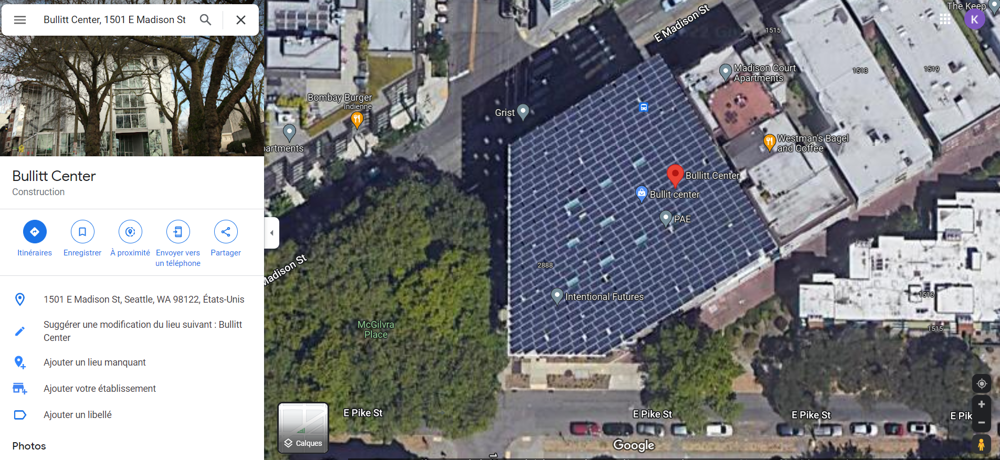

<div class="alert alert-info">
Ce n'est peut etre pas une erreur!!! </br>
Ce batiment est couvert de panneau solaire photovoltaique. </br>
Ce batiment peut donc produire plus qu'elle ne consomme d'énergie, et obtenir un TotalGHGEmissions négatif
Mais dans le cadre du projet celui sera supprimé de notre dataset.
</div>

In [ ]:
#df_cleaned.loc[df_cleaned['TotalGHGEmissions']<0,'TotalGHGEmissions'] = 0
df_cleaned = df_cleaned.loc[df_cleaned['TotalGHGEmissions']>0] 

valeurs négatives pour Consommation dNRJ?

In [ ]:
#df_cleaned.loc[df_cleaned['SiteEnergyUseWN(kBtu)']<1,'SiteEnergyUseWN(kBtu)'] = np.nan
df_cleaned = df_cleaned.loc[df_cleaned['SiteEnergyUseWN(kBtu)']>1] 

##### Others

In [ ]:
df_cleaned[['PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore','Age']].describe()

### <a name="C35"><font color='teal'>3.5 Data Visualisation Multivariée</font></a> 

Box plot
Histogram
Multi-vari chart
Run chart
Pareto chart
Scatter plot (2D/3D)
Stem-and-leaf plot
Parallel coordinates
Odds ratio
Targeted projection pursuit
Heat map
Bar chart

#### <font color='teal'> - 3.5.1 Data target numerique</font>

In [ ]:
warnings.filterwarnings(action='ignore')
for column in df_cleaned.select_dtypes(np.number).columns:
    plt.figure(figsize=(12,5))
    plt.title('Distribution de ' + column)
    sns.histplot(df_cleaned[column].dropna(), bins=30)

#### <font color='teal'> - 3.5.2 Data target catégorielle</font>

### <a name="C38"><font color='teal'>3.8 Multi Colinéarité</font></a> 

#### <font color='teal'>3.8.a Matrice de Corrélation</font>

In [ ]:
# Etude des correlations
df_cleaned.corr()\
.style.background_gradient(cmap = sns.color_palette("blend:white,green", as_cmap=True),axis=None)\
.format('{:.3f}')

Il y a beaucoups de données corrélées.</br>
Simplement car certaines colonnes sont justes des conversion d'autres colonnes en une autre unité. 
</br>
Ex: 1kWh = 1kBtu
suppression une à une

#### <font color='teal'>3.8.b Remove Highly Correlated Features</font>

In [141]:
# Function to list features that are correlated
# Adds the first of the correlated pair only (not both)
def correlatedFeatures(dataset, threshold):
    correlated_columns = set()
    correlations = dataset.corr()
    for i in range(len(correlations)):
        for j in range(i):
            if abs(correlations.iloc[i,j]) > threshold:
                correlated_columns.add(correlations.columns[i]+'_'+correlations.index[j])
    return correlated_columns

In [142]:
# Get a set of correlated features, based on threshold correlation of 0.85
cf = correlatedFeatures(df_cleaned, 0.7)
cf

{'LargestPropertyUseTypeGFA_PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA_PropertyGFATotal',
 'PropertyGFABuilding(s)_PropertyGFATotal',
 'TotalGHGEmissions_SiteEnergyUseWN(kBtu)'}

In [143]:
import scipy
def compute_corr(df):
    """
    Calcul la corrélation entre les colonnes numerique
    retourne un dataset composé de 4 colonnes c1, c2, Corrélation de Pearson Corrélation de Spearman
    """
    df_corr=dict()
    for c1 in df.select_dtypes(include=[np.number]).columns:
        for c2 in df.select_dtypes(include=[np.number]).columns:
            if c1 != c2:
                x = df[[c1,c2]].dropna()[c1].values
                y = df[[c1,c2]].dropna()[c2].values
                df_corr[c1+'_'+c2] = [scipy.stats.pearsonr(x, y)[0] ,
                                   scipy.stats.spearmanr(x, y)[0]]
    result = pd.DataFrame.from_dict(df_corr, orient='index').reset_index()
    result[['Colonne1','Colonne2']] = result['index'].str.split("_",expand=True,)
    result.drop(columns=['index'],inplace=True)
    result.rename(columns={0:'pearson',1:'spearman'},inplace=True)
    
    return result[['Colonne1','Colonne2','pearson','spearman']]

In [144]:
corr_data = compute_corr(df_cleaned)
corr_data.loc[(corr_data.pearson>=0.9) | (corr_data.spearman>=0.9)].sort_values('pearson')

,Colonne1,Colonne2,pearson,spearman
154,SiteEnergyUseWN(kBtu),TotalGHGEmissions,0.921564,0.878762
167,TotalGHGEmissions,SiteEnergyUseWN(kBtu),0.921564,0.878762
84,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,0.950280,0.917364
97,LargestPropertyUseTypeGFA,PropertyGFABuilding(s),0.950280,0.917364
58,PropertyGFATotal,LargestPropertyUseTypeGFA,0.951934,0.920615
95,LargestPropertyUseTypeGFA,PropertyGFATotal,0.951934,0.920615
57,PropertyGFATotal,PropertyGFABuilding(s),0.979704,0.978020
82,PropertyGFABuilding(s),PropertyGFATotal,0.979704,0.978020


In [145]:
print('Notre dataset est de dimension ',df_cleaned.shape)

Notre dataset est de dimension  (1536, 24)


# <a name="C4"><font color='green'>**Partie 4 : Cleaning**</font></a> 

In [146]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
FifthLargestPropertyUseType,100.00,0
FourthLargestPropertyUseType,100.00,0
TotalGHGEmissions,100.00,0
SiteEnergyUseWN(kBtu),100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
SixthLargestPropertyUseType,100.00,0


### <a name="C41"><font color='green'>4.1 Imputer Missing Data </font></a> 

In [ ]:
#Num
imputerNum = IterativeImputer(max_iter=500, random_state=0)
imputed = imputerNum.fit_transform( df_cleaned.select_dtypes(include=np.number) )
df_numImputed = pd.DataFrame(imputed,index=df_cleaned.index, columns=df_cleaned.select_dtypes(include=np.number).columns)

# Categorical
# pas besoin car pas de valeurs manquantes

# mergeing step
df_cleaned = pd.merge(df_cleaned.select_dtypes(exclude=np.number), df_numImputed, left_index=True, right_index=True) 

In [ ]:
compute_nb_mising_values(df_cleaned)

### <a name="C42"><font color='green'>4.2 Export csv</font></a> 

In [147]:
#### data_cleaned without encoding

In [148]:
path_clean = 'data/cleaned/'
filename_clean = 'df_cleaned.csv'
df_cleaned.to_csv(path_clean+filename_clean,index=True,sep=';')

In [149]:
compute_nb_mising_values(df_cleaned)

,Taux de valeurs non nulles,Nombre de valeurs manquantes
BuildingType,100.00,0
FifthLargestPropertyUseType,100.00,0
FourthLargestPropertyUseType,100.00,0
TotalGHGEmissions,100.00,0
SiteEnergyUseWN(kBtu),100.00,0
ThirdLargestPropertyUseTypeGFA,100.00,0
ThirdLargestPropertyUseType,100.00,0
SecondLargestPropertyUseTypeGFA,100.00,0
SecondLargestPropertyUseType,100.00,0
SixthLargestPropertyUseType,100.00,0


</br>

</br>

</br>